# **Waste Material Segregation for Improving Waste Management**

## **Objective**

The objective of this project is to implement an effective waste material segregation system using convolutional neural networks (CNNs) that categorises waste into distinct groups. This process enhances recycling efficiency, minimises environmental pollution, and promotes sustainable waste management practices.

The key goals are:

* Accurately classify waste materials into categories like cardboard, glass, paper, and plastic.
* Improve waste segregation efficiency to support recycling and reduce landfill waste.
* Understand the properties of different waste materials to optimise sorting methods for sustainability.

## **Data Understanding**

The Dataset consists of images of some common waste materials.

1. Food Waste
2. Metal
3. Paper
4. Plastic
5. Other
6. Cardboard
7. Glass


**Data Description**

* The dataset consists of multiple folders, each representing a specific class, such as `Cardboard`, `Food_Waste`, and `Metal`.
* Within each folder, there are images of objects that belong to that category.
* However, these items are not further subcategorised. <br> For instance, the `Food_Waste` folder may contain images of items like coffee grounds, teabags, and fruit peels, without explicitly stating that they are actually coffee grounds or teabags.

## **1. Load the data**

Load and unzip the dataset zip file.

In [ ]:
# # mounting the google-drive:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
# import mimetypes
# print(mimetypes.guess_type("data.zip"))

In [ ]:
# # How to unzip:
# import zipfile

# with zipfile.ZipFile('data.zip', 'r') as zip_ref:
#     zip_ref.extractall('data')

In [ ]:
# Looking into our directory:
!ls data/data

Cardboard  Food_Waste  Glass  Metal  Paper  Plastic


In [ ]:
# # Intentionally removed the 'other' class since it has a lot of variations and will unnecessarily confuse the model:
# ! ls /content/drive/MyDrive/waste_water_assignment_upgrad/data

In [ ]:
# Lets check how many files are there in each folder (each class):
import os

data_dir = 'data/data'
class_folders = os.listdir(data_dir)

for folder in class_folders:
    folder_path = os.path.join(data_dir, folder)
    num_files = len(os.listdir(folder_path))
    print(f"Number of files in {folder}: {num_files}")

Number of files in Food_Waste: 1000
Number of files in Metal: 1000
Number of files in Glass: 750
Number of files in Paper: 1030
Number of files in Cardboard: 540
Number of files in .ipynb_checkpoints: 0
Number of files in Plastic: 2295


We can see that there is some class imbalance here which can be handlded by image augmentation. But lets not do it now. Sometimes, not doing it might also  work. So, first lets do all the other required steps and check how the model
performs and then we can come back to this if required.

**Import Necessary Libraries**

In [ ]:
# Recommended versions:

# numpy version: 1.26.4
# pandas version: 2.2.2
# seaborn version: 0.13.2
# matplotlib version: 3.10.0
# PIL version: 11.1.0
# tensorflow version: 2.18.0
# keras version: 3.8.0
# sklearn version: 1.6.1

In [ ]:
# Import essential libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout
import cv2

## **2. Data Preparation** <font color=red> [25 marks] </font><br>


#### **2.1.1** <font color=red> [3 marks] </font><br>
Create a function to load the images.

In [ ]:
# This has been directly taken care-off using tf.keras where the data and have been
# splitted into train and validation with their labels attached.

# Image resizeinf has also been taken care-off here only which is
# a part of pre-processing.

In [ ]:

IMG_HEIGHT = 256
IMG_WIDTH = 256
BATCH_SIZE = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  labels='inferred',
  label_mode='int',
  image_size=(IMG_HEIGHT, IMG_WIDTH),
  interpolation='nearest',
  batch_size=BATCH_SIZE,
  shuffle=True,
  seed=42,
  validation_split=0.2,
  subset='training',
)

validation_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  labels='inferred',
  label_mode='int',
  image_size=(IMG_HEIGHT, IMG_WIDTH),
  interpolation='nearest',
  batch_size=BATCH_SIZE,
  shuffle=False,  # Keep False for consistent evaluation
  seed=42,
  validation_split=0.2,
  subset='validation',
)

# Print class names
class_names = train_ds.class_names
print(class_names)

# Configure the datasets for performance
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
validation_ds = validation_ds.cache().prefetch(buffer_size=AUTOTUNE)


Found 6615 files belonging to 6 classes.
Using 5292 files for training.


2025-06-19 13:02:36.569659: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-06-19 13:02:36.650356: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-06-19 13:02:36.650632: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Found 6615 files belonging to 6 classes.
Using 1323 files for validation.
['Cardboard', 'Food_Waste', 'Glass', 'Metal', 'Paper', 'Plastic']


## **Saving datasets to use later** ##

In [ ]:
# # Define paths to save the datasets
# train_save_path = '/content/drive/MyDrive/waste_water_assignment_upgrad/train_ds_saved'
# validation_save_path = '/content/drive/MyDrive/waste_water_assignment_upgrad/validation_ds_saved'

# # Save the datasets
# tf.data.experimental.save(train_ds, train_save_path)
# tf.data.experimental.save(validation_ds, validation_save_path)

# print(f"Training dataset saved to: {train_save_path}")
# print(f"Validation dataset saved to: {validation_save_path}")


In [ ]:
# # Define paths where the datasets were saved
# train_load_path = '/content/drive/MyDrive/waste_water_assignment_upgrad/train_ds_saved'
# validation_load_path = '/content/drive/MyDrive/waste_water_assignment_upgrad/validation_ds_saved'

# # Load the saved datasets
# train_ds_loaded = tf.data.experimental.load(train_load_path, element_spec=train_ds.element_spec)
# validation_ds_loaded = tf.data.experimental.load(validation_load_path, element_spec=validation_ds.element_spec)

# print(f"Training dataset loaded from: {train_load_path}")
# print(f"Validation dataset loaded from: {validation_load_path}")

### **2.1 Load and Preprocess Images** <font color=red> [8 marks] </font><br>

Let us create a function to load the images first. We can then directly use this function while loading images of the different categories to load and crop them in a single step.

In [ ]:
# The loading of the images has been taken care-off in the previous step

#### **2.1.2** <font color=red> [5 marks] </font><br>
Load images and labels.

Load the images from the dataset directory. Labels of images are present in the subdirectories.

Verify if the images and labels are loaded correctly.

2025-06-19 13:02:49.713154: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] ShuffleDatasetV3:14: Filling up shuffle buffer (this may take a while): 117 of 1000
2025-06-19 13:02:54.556088: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:452] Shuffle buffer filled.


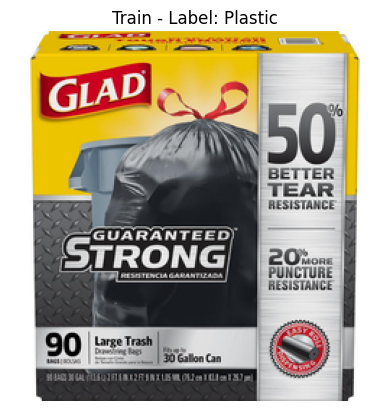

2025-06-19 13:02:54.856983: W tensorflow/core/kernels/data/cache_dataset_ops.cc:858] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


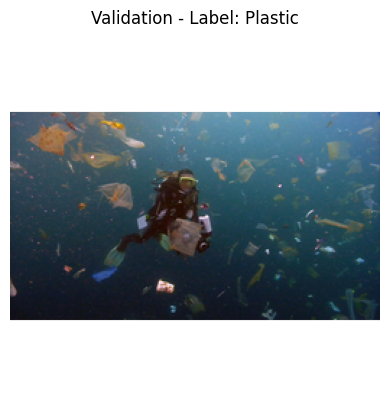

In [ ]:
# Checking random images from train and validation dataset:

import tensorflow as tf
from tensorflow.keras.utils import array_to_img
import matplotlib.pyplot as plt

def show_random_image(dataset, dataset_name=""):
    for images, labels in dataset.take(1):  # take one batch
        random_index = tf.random.uniform([], 0, tf.shape(images)[0], dtype=tf.int32)
        image = images[random_index]
        label = labels[random_index]

        # Convert tensor to image
        img = array_to_img(image)

        # Display
        plt.imshow(img)
        plt.title(f"{dataset_name} - Label: {class_names[label.numpy()]}")
        plt.axis("off")
        plt.show()

# Show from train_ds
show_random_image(train_ds, "Train")

# Show from validation_ds
show_random_image(validation_ds, "Validation")


In [ ]:
# This step has been performed earlier whiling creating train and validaiton

In [ ]:
# Everything seems fine. The only thing is it took too long for showing up random images. This is because even take(1) will trigger prefetching and caching logic,
# which starts processing a large part of the dataset behind the scenes — even though you just want one sample.

# So yes: TensorFlow starts preparing multiple batches in the background, making it slow just to get one random image.
# Next time I will try to prepare data without tensorflow and then
# only make the model with tensorflow.

Perform any operations, if needed, on the images and labels to get them into the desired format.

In [ ]:
# Normalise intensity values --> brining them in between 0 and 1:

def process(image, label):
  image = tf.cast(image,tf.float32)/255.0   # First cast to float and then divide
  return image, label

train_ds = train_ds.map(process)
validation_ds = validation_ds.map(process)

Checking the normalization in couple of steps:

In [ ]:
for images, labels in train_ds.take(1):
  # 'images' is a batch of images (a tensor)
  # 'labels' is a batch of corresponding labels (a tensor)

  # Check the shape of the images tensor
  print("Shape of images tensor:", images.shape)

  # Print the values of the first image in the batch
  print("Values of the first image (first pixel):", images[0][0][0])
  print("Min value in the batch:", tf.reduce_min(images))
  print("Max value in the batch:", tf.reduce_max(images))


Shape of images tensor: (32, 256, 256, 3)
Values of the first image (first pixel): tf.Tensor([1. 1. 1.], shape=(3,), dtype=float32)
Min value in the batch: tf.Tensor(0.0, shape=(), dtype=float32)
Max value in the batch: tf.Tensor(1.0, shape=(), dtype=float32)


In [ ]:
for images, labels in train_ds.take(1):
    # images is a batch of images, usually shape (BATCH_SIZE, height, width, channels)

    # Convert the first image in the batch to a NumPy array
    image_array = images[0].numpy()

    print("Image shape:", image_array.shape)  # (height, width, channels)
    print("Image pixel values:\n", image_array)  # full array
    print("Image labels:", labels[0])

    # Optional: check range and some stats
    print("Min pixel value:", image_array.min())
    print("Max pixel value:", image_array.max())
    print("Data type:", image_array.dtype)


Image shape: (256, 256, 3)
Image pixel values:
 [[[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 ...

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]]
Image labels: tf.Tensor(4, shape=(), dtype=int32)
Min pixel value: 0.0
Max pixel value: 1.0
Data type: float32


### **2.2 Data Visualisation** <font color=red> [9 marks] </font><br>

#### **2.2.1** <font color=red> [3 marks] </font><br>
Create a bar plot to display the class distribution

The above step has been done further ahead in the process.

# Visualise Data Distribution:
This has been done further ahead during this analysis.

#### **2.2.2** <font color=red> [3 marks] </font><br>
Visualise some sample images

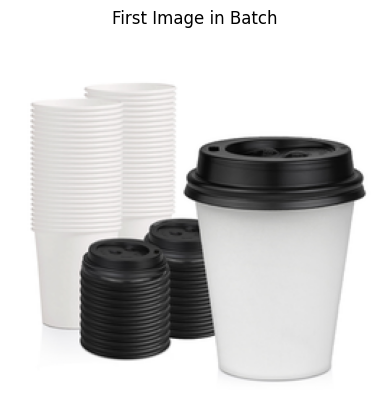

In [ ]:
# Visualise Sample Images (across different labels)

plt.imshow(image_array)
plt.axis('off')
plt.title("First Image in Batch")
plt.show()

Label index: 5
Class name: Plastic


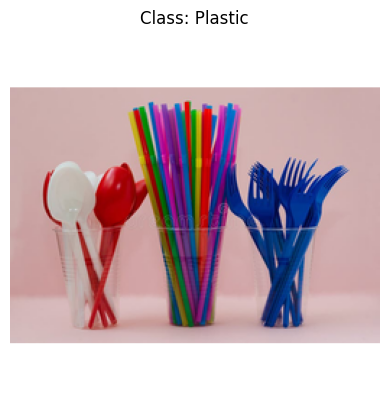

In [ ]:
# Display one image and class name
for images, labels in train_ds.take(1):
    image = images[5].numpy()
    label_index = labels[5].numpy()
    class_name = class_names[label_index]

    print("Label index:", label_index)
    print("Class name:", class_name)

    import matplotlib.pyplot as plt
    plt.imshow(image)
    plt.title(f"Class: {class_name}")
    plt.axis('off')
    plt.show()

Label index: 5
Class name: Plastic


2025-06-19 13:02:55.974287: W tensorflow/core/kernels/data/cache_dataset_ops.cc:858] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


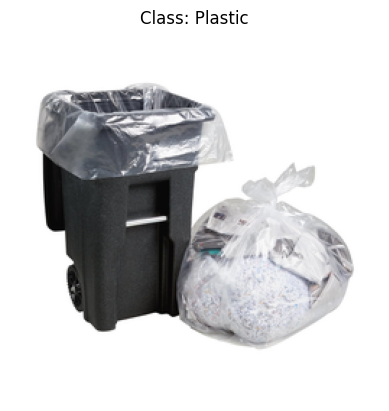

In [ ]:
# Display one image and class name
for images, labels in validation_ds.take(1):
    image = images[4].numpy()
    label_index = labels[4].numpy()
    class_name = class_names[label_index]

    print("Label index:", label_index)
    print("Class name:", class_name)

    import matplotlib.pyplot as plt
    plt.imshow(image)
    plt.title(f"Class: {class_name}")
    plt.axis('off')
    plt.show()

#### **2.2.3** <font color=red> [3 marks] </font><br>
Based on the smallest and largest image dimensions, resize the images.

In [ ]:
# Find the smallest and largest image dimensions from the data set

# A size of 256 X 256 has been taken for simplicity irrespective of
# the minimum and maximum image size.

# All these things has been taken care-off earlier while splitting.

# tf.keras has great features where everything can be done simultaneously
# in one step.


### **2.3 Encoding the classes** <font color=red> [3 marks] </font><br>

There are seven classes present in the data.

We have extracted the images and their labels, and visualised their distribution. Now, we need to perform encoding on the labels. Encode the labels suitably.

In [ ]:
# Note that the encoding was also taken care-off while splitting data in train_ds
# and validation_ds

### **2.4 Data Splitting** <font color=red> [5 marks] </font><br>

#### **2.4.1** <font color=red> [5 marks] </font><br>
Split the dataset into training and validation sets

In [ ]:
# Assign specified parts of the dataset to train and validation sets

# This has been taken care-off in an earlier step using tf.keras.

## **3. Model Building and Evaluation** <font color=red> [20 marks] </font><br>

### **3.1 Model building and training** <font color=red> [15 marks] </font><br>

#### **3.1.1** <font color=red> [10 marks] </font><br>
Build and compile the model. Use 3 convolutional layers. Add suitable normalisation, dropout, and fully connected layers to the model.

Test out different configurations and report the results in conclusions.

In [ ]:
# Everything seems fine. Lets proceed with the model building.

In [ ]:
# Build and compile the model


# using batch normalization in the cnn model

from keras.layers import BatchNormalization

model = Sequential()

# First Convolutional Layer
model.add(Conv2D(32, kernel_size=(3, 3), padding='valid', activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model.add(BatchNormalization())  # Add Batch Normalization
model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid'))

# Second Convolutional Layer
model.add(Conv2D(64, kernel_size=(3, 3), padding='valid', activation='relu'))
model.add(BatchNormalization())  # Add Batch Normalization
model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid'))

# Third Convolutional Layer
model.add(Conv2D(128, kernel_size=(3, 3), padding='valid', activation='relu'))
model.add(BatchNormalization())  # Add Batch Normalization
model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid'))

# Flatten the output for the fully connected layers
model.add(Flatten())

# Fully Connected Layers
model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())  # Add Batch Normalization
model.add(Dropout(0.5)) # Added dropout for regularization
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())  # Add Batch Normalization
model.add(Dropout(0.5)) # Added dropout for regularization
model.add(Dense(len(class_names), activation='softmax')) # Output layer with softmax for classification

# Print the model summary
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 batch_normalization (Batch  (None, 254, 254, 32)      128       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 batch_normalization_1 (Bat  (None, 125, 125, 64)      256       
 chNormalization)                                                
                                                        

In [ ]:
model.compile(optimizer='adam',
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), # output layer already has softmax --> so logits is set false
              metrics=['accuracy'])

#### **3.1.2** <font color=red> [5 marks] </font><br>
Train the model.

Use appropriate metrics and callbacks as needed.

In [ ]:
# Training:

In [ ]:
histroy = model.fit(train_ds, validation_data=validation_ds, epochs=20)

Epoch 1/20


2025-06-19 13:02:58.680250: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2025-06-19 13:03:02.092737: I external/local_xla/xla/service/service.cc:168] XLA service 0x8ac6830 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-06-19 13:03:02.092809: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): Quadro P5000, Compute Capability 6.1
2025-06-19 13:03:02.136678: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1750338182.384572     184 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


166/166 [==============================] - 29s 119ms/step - loss: 2.0252 - accuracy: 0.3496 - val_loss: 2.2970 - val_accuracy: 0.1073
Epoch 2/20
166/166 [==============================] - 16s 98ms/step - loss: 1.5187 - accuracy: 0.4505 - val_loss: 1.9633 - val_accuracy: 0.2918
Epoch 3/20
166/166 [==============================] - 16s 97ms/step - loss: 1.3190 - accuracy: 0.5100 - val_loss: 0.8650 - val_accuracy: 0.6946
Epoch 4/20
166/166 [==============================] - 16s 99ms/step - loss: 1.1408 - accuracy: 0.5826 - val_loss: 1.1987 - val_accuracy: 0.4989
Epoch 5/20
166/166 [==============================] - 16s 98ms/step - loss: 1.0397 - accuracy: 0.6175 - val_loss: 0.4416 - val_accuracy: 0.9252
Epoch 6/20
166/166 [==============================] - 17s 99ms/step - loss: 1.0269 - accuracy: 0.6204 - val_loss: 0.4966 - val_accuracy: 0.8942
Epoch 7/20
166/166 [==============================] - 16s 99ms/step - loss: 0.8398 - accuracy: 0.7077 - val_loss: 0.9973 - val_accuracy: 0.6122
Ep

#### **3.2.1** <font color=red> [5 marks] </font><br>
Evaluate the model on test dataset. Derive appropriate metrics.

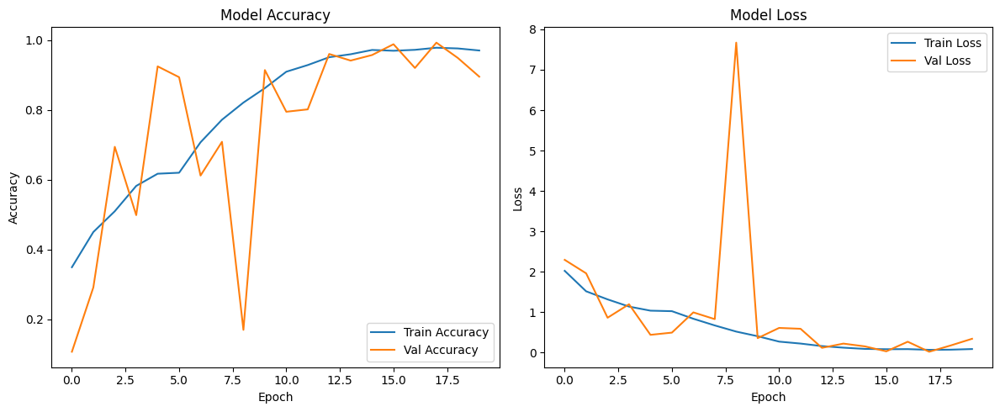

In [ ]:
# Evaluate on the test set; display suitable metrics


plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(histroy.history['accuracy'], label='Train Accuracy')
plt.plot(histroy.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(histroy.history['loss'], label='Train Loss')
plt.plot(histroy.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

The model is performing really bad:<br>

**Training Accuracy** steadily increases and approaches 1.0 by the final epochs — a strong sign of overfitting.

**Validation Accuracy** is very unstable — jumping wildly between ~20% and ~100%.
This is not normal and suggests:

1. Small validation dataset

2. Class imbalance

3. Poor generalization

4. Possibly random validation performance (model memorizing training data)

**Training Loss** decreases nicely and nearly reaches zero, again pointing to overfitting.

**Validation Loss** is highly erratic, with spikes (e.g., at epoch 9, 12, 15).

This is unusual and indicates instability, possibly due to:

1. Very few validation samples

2. Incorrect or inconsistent labels

3. Model is confident but wrong → leads to high loss

4. Learning rate being too high

Lets do some few adjustments:
1. Reduce learning rate
2. Add L2 regularization layers

Test out different configurations and report the results in conclusions.

In [ ]:
from tensorflow.keras import regularizers

# L2 regularization strength
l2_strength = 0.001

model2 = Sequential()

# First Convolutional Layer
model2.add(Conv2D(32, (3, 3), padding='valid', activation='relu',
                 kernel_regularizer=regularizers.l2(l2_strength),
                 input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model2.add(BatchNormalization())
model2.add(MaxPooling2D((2, 2), strides=2, padding='valid'))

# Second Convolutional Layer
model2.add(Conv2D(64, (3, 3), padding='valid', activation='relu',
                 kernel_regularizer=regularizers.l2(l2_strength)))
model2.add(BatchNormalization())
model2.add(MaxPooling2D((2, 2), strides=2, padding='valid'))

# Third Convolutional Layer
model2.add(Conv2D(128, (3, 3), padding='valid', activation='relu',
                 kernel_regularizer=regularizers.l2(l2_strength)))
model2.add(BatchNormalization())
model2.add(MaxPooling2D((2, 2), strides=2, padding='valid'))

# Flatten the output
model2.add(Flatten())

# Fully Connected Layers
model2.add(Dense(256, activation='relu',
                kernel_regularizer=regularizers.l2(l2_strength)))
model2.add(BatchNormalization())
model2.add(Dropout(0.5))

model2.add(Dense(128, activation='relu',
                kernel_regularizer=regularizers.l2(l2_strength)))
model2.add(BatchNormalization())
model2.add(Dropout(0.5))

# Output layer with softmax (since you're not using from_logits=True)
model2.add(Dense(len(class_names), activation='softmax'))

# Print model summary
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 batch_normalization_5 (Bat  (None, 254, 254, 32)      128       
 chNormalization)                                                
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 127, 127, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 batch_normalization_6 (Bat  (None, 125, 125, 64)      256       
 chNormalization)                                                
                                                      

In [ ]:
model2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',  # from_logits=False by default
    metrics=['accuracy']
)

In [ ]:
model2_histroy = model2.fit(train_ds, validation_data=validation_ds, epochs=20)

Epoch 1/20
166/166 [==============================] - 21s 103ms/step - loss: 2.9376 - accuracy: 0.3411 - val_loss: 1.3093 - val_accuracy: 1.0000
Epoch 2/20
166/166 [==============================] - 17s 103ms/step - loss: 2.4845 - accuracy: 0.4480 - val_loss: 1.4436 - val_accuracy: 0.8488
Epoch 3/20
166/166 [==============================] - 17s 105ms/step - loss: 2.2119 - accuracy: 0.5338 - val_loss: 1.4343 - val_accuracy: 0.9017
Epoch 4/20
166/166 [==============================] - 17s 100ms/step - loss: 2.0618 - accuracy: 0.5826 - val_loss: 1.9289 - val_accuracy: 0.6190
Epoch 5/20
166/166 [==============================] - 17s 101ms/step - loss: 1.8480 - accuracy: 0.6550 - val_loss: 1.2976 - val_accuracy: 0.9312
Epoch 6/20
166/166 [==============================] - 17s 100ms/step - loss: 1.6668 - accuracy: 0.7266 - val_loss: 1.1393 - val_accuracy: 0.9516
Epoch 7/20
166/166 [==============================] - 17s 102ms/step - loss: 1.5731 - accuracy: 0.7653 - val_loss: 1.0646 - val_ac

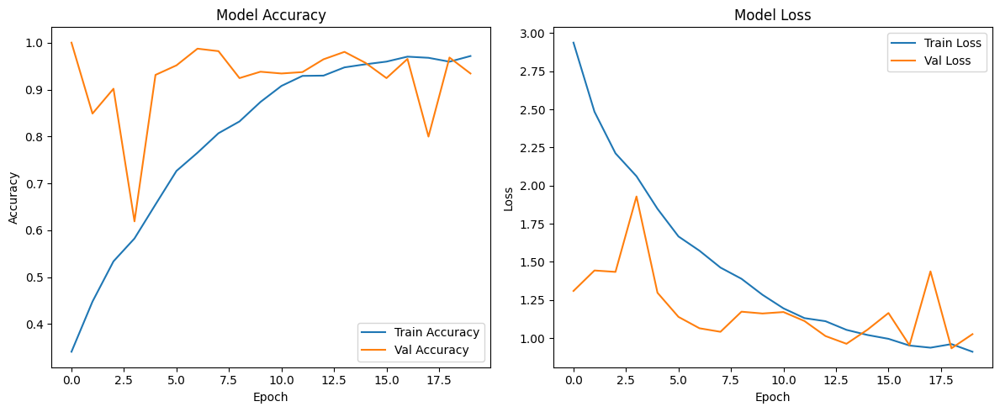

In [ ]:
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(model2_histroy.history['accuracy'], label='Train Accuracy')
plt.plot(model2_histroy.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(model2_histroy.history['loss'], label='Train Loss')
plt.plot(model2_histroy.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
new_model1 = model.save('models/new_model1')
new_model2 = model2.save('models/new_model2')

INFO:tensorflow:Assets written to: models/new_model1/assets


INFO:tensorflow:Assets written to: models/new_model1/assets


INFO:tensorflow:Assets written to: models/new_model2/assets


INFO:tensorflow:Assets written to: models/new_model2/assets


In [ ]:
# Lets check how the models are performing to unknown data:
# Lets check the prediction of the model on few of the random images:
import os
import random
from PIL import Image

source_folder = 'sample_images'
image_paths = [os.path.join(source_folder, fname) for fname in os.listdir(source_folder)]
sample_images = random.sample(image_paths, 5)

In [ ]:
# Preprocessing of the random images:

IMG_HEIGHT = 256
IMG_WIDTH = 256

def loadandpreprocess(image_path):
  img = Image.open(image_path).convert('RGB')
  img = img.resize((IMG_WIDTH, IMG_HEIGHT))
  img_array = np.array(img) / 255.0
  return img_array

1/1 [==============================] - 0s 96ms/step


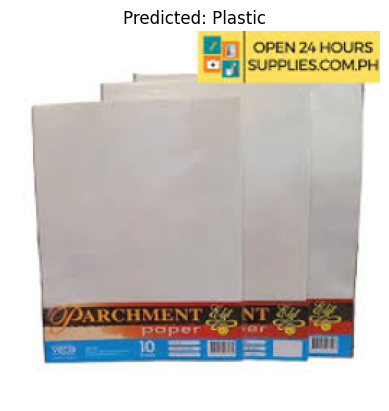

1/1 [==============================] - 0s 27ms/step


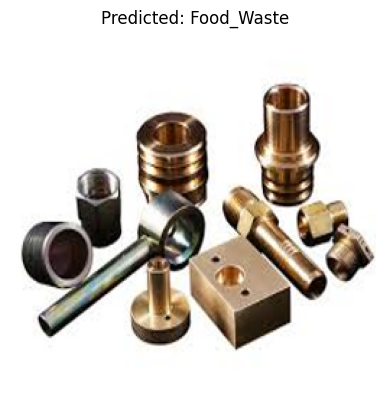

1/1 [==============================] - 0s 54ms/step


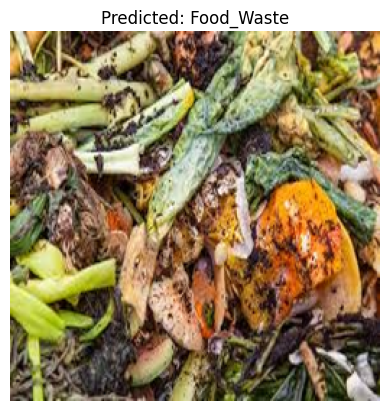

1/1 [==============================] - 0s 26ms/step


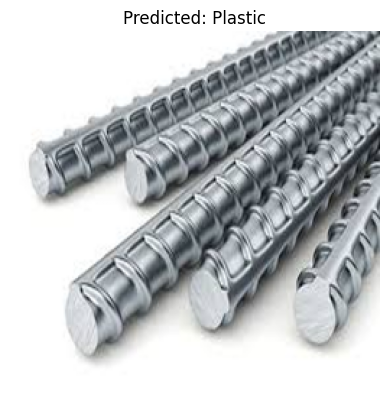

1/1 [==============================] - 0s 27ms/step


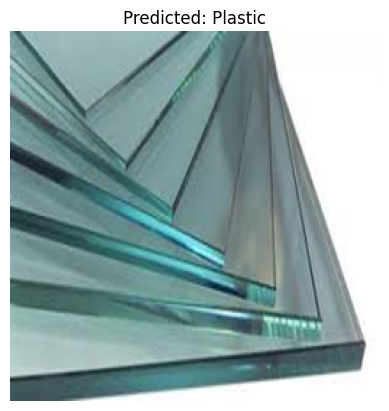

In [ ]:
# Predict and visualize sample images:
for image in sample_images:
  img_array = loadandpreprocess(image)
  img_array = np.expand_dims(img_array, axis=0)
  prediction = model.predict(img_array)
  predicted_class = class_names[np.argmax(prediction)]

  # Display
  plt.imshow(np.squeeze(img_array,axis=0))
  plt.title(f"Predicted: {predicted_class}")
  plt.axis('off')
  plt.show()

In [ ]:
# The first models is predicting really bad. Lets check the prediction made by the 2nd model.

1/1 [==============================] - 0s 27ms/step


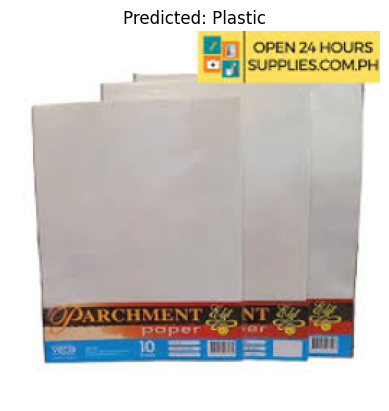

1/1 [==============================] - 0s 26ms/step


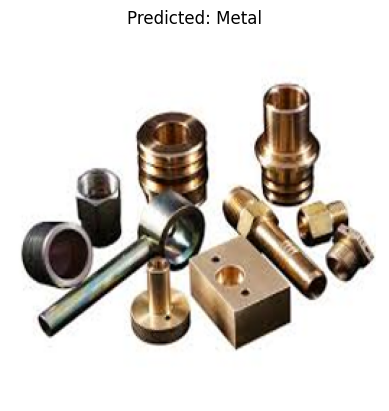

1/1 [==============================] - 0s 26ms/step


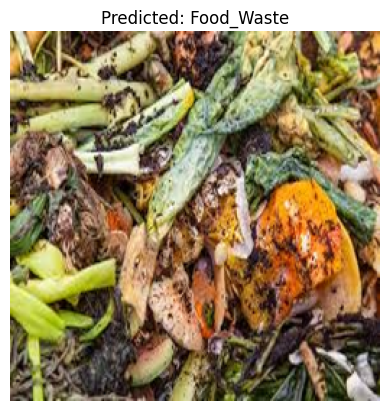

1/1 [==============================] - 0s 22ms/step


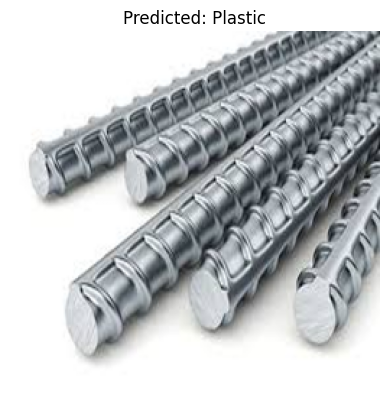

1/1 [==============================] - 0s 30ms/step


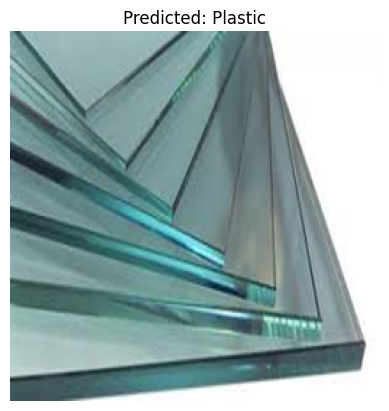

In [ ]:
# Predict and visualize sample images:
for image in sample_images:
  img_array = loadandpreprocess(image)
  img_array = np.expand_dims(img_array, axis=0)
  prediction = model2.predict(img_array)
  predicted_class = class_names[np.argmax(prediction)]

  # Display
  plt.imshow(np.squeeze(img_array,axis=0))
  plt.title(f"Predicted: {predicted_class}")
  plt.axis('off')
  plt.show()

In [ ]:
# Both the models are not doing very well. Lets try class_weights.

In [ ]:
# The problem is class imbalance. Plastic is dominating over other classes. Also, the validation data consists
# only of one class i.e. plastic

In [ ]:
# Model Evaluation:
loss, accuracy = model.evaluate(validation_ds)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

42/42 [==============================] - 1s 26ms/step - loss: 0.3439 - accuracy: 0.8957
Test Loss: 0.3439
Test Accuracy: 0.8957


In [ ]:
# Model Evaluation:
loss, accuracy = model2.evaluate(validation_ds)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

42/42 [==============================] - 1s 27ms/step - loss: 1.0261 - accuracy: 0.9342
Test Loss: 1.0261
Test Accuracy: 0.9342


In [ ]:
y_true = []
y_pred = []

for images, labels in validation_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

1/1 [==============================] - 0s 28ms/step


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred, target_names=class_names))

              precision    recall  f1-score   support

   Cardboard       0.00      0.00      0.00         0
  Food_Waste       0.00      0.00      0.00         0
       Glass       0.00      0.00      0.00         0
       Metal       0.00      0.00      0.00         0
       Paper       0.00      0.00      0.00         0
     Plastic       1.00      0.90      0.94      1323

    accuracy                           0.90      1323
   macro avg       0.17      0.15      0.16      1323
weighted avg       1.00      0.90      0.94      1323



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
y_true = []
y_pred = []

for images, labels in validation_ds:
    preds = model2.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

1/1 [==============================] - 0s 26ms/step


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred, target_names=class_names))

              precision    recall  f1-score   support

   Cardboard       0.00      0.00      0.00         0
  Food_Waste       0.00      0.00      0.00         0
       Glass       0.00      0.00      0.00         0
       Metal       0.00      0.00      0.00         0
       Paper       0.00      0.00      0.00         0
     Plastic       1.00      0.93      0.97      1323

    accuracy                           0.93      1323
   macro avg       0.17      0.16      0.16      1323
weighted avg       1.00      0.93      0.97      1323



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Lets try early-stopping in both the models:

# for first model:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='val_loss',     # or 'val_accuracy' depending on your goal
    patience=3,             # number of epochs with no improvement after which training will be stopped
    restore_best_weights=True # restores the weights from the epoch with the best value of the monitored quantity
)

history_new = model.fit(
    train_ds,
    validation_data=validation_ds,
    epochs=20,
    callbacks=[early_stop]
)


Epoch 1/20
166/166 [==============================] - 17s 102ms/step - loss: 0.0510 - accuracy: 0.9836 - val_loss: 0.0818 - val_accuracy: 0.9781
Epoch 2/20
166/166 [==============================] - 16s 98ms/step - loss: 0.0532 - accuracy: 0.9807 - val_loss: 0.1588 - val_accuracy: 0.9615
Epoch 3/20
166/166 [==============================] - 17s 100ms/step - loss: 0.0589 - accuracy: 0.9796 - val_loss: 0.0897 - val_accuracy: 0.9667
Epoch 4/20
166/166 [==============================] - 16s 99ms/step - loss: 0.0693 - accuracy: 0.9754 - val_loss: 0.8566 - val_accuracy: 0.7861


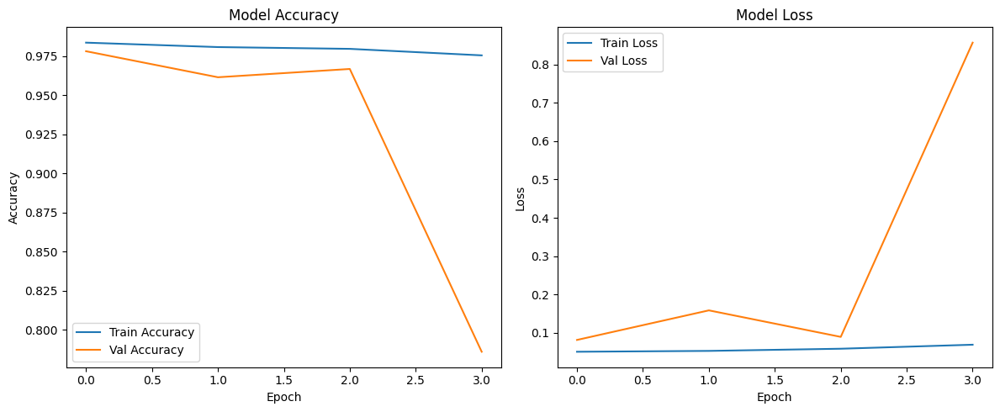

In [ ]:
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history_new.history['accuracy'], label='Train Accuracy')
plt.plot(history_new.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history_new.history['loss'], label='Train Loss')
plt.plot(history_new.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Lets try early-stopping in both the models:

# for first model:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='val_loss',     # or 'val_accuracy' depending on your goal
    patience=3,             # number of epochs with no improvement after which training will be stopped
    restore_best_weights=True # restores the weights from the epoch with the best value of the monitored quantity
)

history_new2 = model2.fit(
    train_ds,
    validation_data=validation_ds,
    epochs=20,
    callbacks=[early_stop]
)


Epoch 1/20
166/166 [==============================] - 17s 101ms/step - loss: 0.8837 - accuracy: 0.9783 - val_loss: 0.8370 - val_accuracy: 0.9887
Epoch 2/20
166/166 [==============================] - 17s 100ms/step - loss: 0.8479 - accuracy: 0.9851 - val_loss: 0.9713 - val_accuracy: 0.9441
Epoch 3/20
166/166 [==============================] - 17s 100ms/step - loss: 0.8243 - accuracy: 0.9828 - val_loss: 0.8609 - val_accuracy: 0.9690
Epoch 4/20
166/166 [==============================] - 17s 100ms/step - loss: 0.8073 - accuracy: 0.9837 - val_loss: 1.0139 - val_accuracy: 0.9297


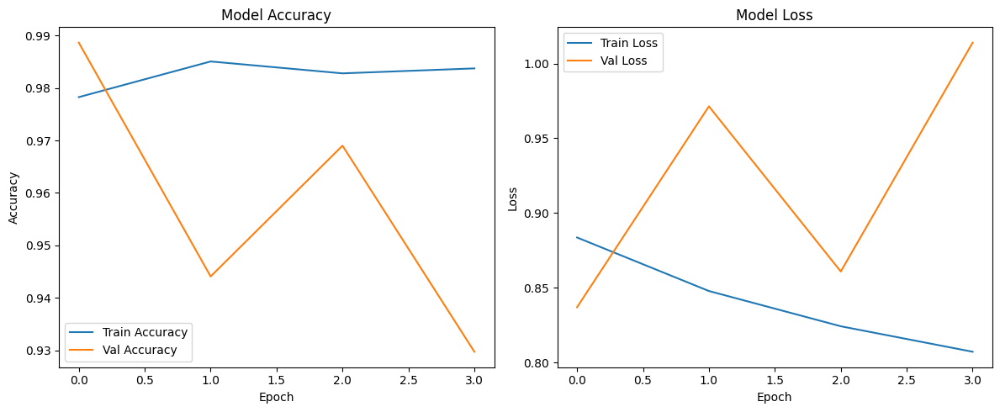

In [ ]:
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history_new2.history['accuracy'], label='Train Accuracy')
plt.plot(history_new2.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history_new2.history['loss'], label='Train Loss')
plt.plot(history_new2.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Not working well

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred, target_names=class_names))

              precision    recall  f1-score   support

   Cardboard       0.00      0.00      0.00         0
  Food_Waste       0.00      0.00      0.00         0
       Glass       0.00      0.00      0.00         0
       Metal       0.00      0.00      0.00         0
       Paper       0.00      0.00      0.00         0
     Plastic       1.00      0.93      0.97      1323

    accuracy                           0.93      1323
   macro avg       0.17      0.16      0.16      1323
weighted avg       1.00      0.93      0.97      1323



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Lets check all the classes represented in the train and validation dataset:
print("class_names:", class_names)
print("Unique labels in y_true:", np.unique(y_true))
print("Length of class_names:", len(class_names))

class_names: ['Cardboard', 'Food_Waste', 'Glass', 'Metal', 'Paper', 'Plastic']
Unique labels in y_true: [5]
Length of class_names: 6


In [ ]:
# We can see here that there is a huge class imbalance and therefore the validation dataset has only one class -> plastic

In [ ]:
import collections

label_count = collections.Counter()
for _, labels in train_ds.unbatch():
    label_count[int(labels.numpy())] += 1

for idx, count in sorted(label_count.items()):
    print(f"{class_names[idx]} ({idx}): {count} images")

Cardboard (0): 449 images
Food_Waste (1): 820 images
Glass (2): 595 images
Metal (3): 787 images
Paper (4): 822 images
Plastic (5): 1819 images


In [ ]:
label_count_val = collections.Counter()
for _, labels in validation_ds.unbatch():
    label_count_val[int(labels.numpy())] += 1

for idx, count in sorted(label_count_val.items()):
    print(f"{class_names[idx]} ({idx}): {count} images in validation set")


Plastic (5): 1323 images in validation set


In [ ]:
# Lets try implimenting use of class_weights. I don't think it will help though. But for the record lets try it once.

In [ ]:
# Shockingly our validation data contains only one class 'Plastic'. This could be because this particular class is highly
# over-represented in our data.
# So, lets try to handle class_imbalance by assigning class_weights.
# so, we have to calculate the class_weights and retrain the model.

# 2nd approach: We can manually ensure that our validation dataset contains images from all the classes.
# Here, we have to use os, glob and sklearn to manually ensure and stratify correctly our observations so that all the classes are
# represented in train_ds and validation_ds equally.

In [ ]:
# Lets calculate class_weights:
from sklearn.utils import class_weight

# Extract all labels from train_ds
y_train = []
for _, labels in train_ds.unbatch():
    y_train.append(labels.numpy())

class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

class_weights = dict(enumerate(class_weights))
print("Class weights:", class_weights)

Class weights: {0: 1.9643652561247216, 1: 1.075609756097561, 2: 1.4823529411764707, 3: 1.1207115628970774, 4: 1.072992700729927, 5: 0.48488180318856516}


In [ ]:
# Lets train the model2 with class weights:
model_class_weights = model2.fit(train_ds, validation_data=validation_ds, epochs=20, class_weight=class_weights)

Epoch 1/20
166/166 [==============================] - 17s 100ms/step - loss: 0.9459 - accuracy: 0.9499 - val_loss: 1.3386 - val_accuracy: 0.8322
Epoch 2/20
166/166 [==============================] - 17s 100ms/step - loss: 0.9598 - accuracy: 0.9497 - val_loss: 0.9624 - val_accuracy: 0.9622
Epoch 3/20
166/166 [==============================] - 17s 100ms/step - loss: 0.9264 - accuracy: 0.9632 - val_loss: 0.9972 - val_accuracy: 0.9403
Epoch 4/20
166/166 [==============================] - 16s 98ms/step - loss: 0.8787 - accuracy: 0.9783 - val_loss: 0.9390 - val_accuracy: 0.9652
Epoch 5/20
166/166 [==============================] - 17s 100ms/step - loss: 0.8484 - accuracy: 0.9826 - val_loss: 0.9534 - val_accuracy: 0.9531
Epoch 6/20
166/166 [==============================] - 17s 100ms/step - loss: 0.8276 - accuracy: 0.9820 - val_loss: 1.7471 - val_accuracy: 0.7324
Epoch 7/20
166/166 [==============================] - 17s 101ms/step - loss: 0.8551 - accuracy: 0.9681 - val_loss: 1.0003 - val_acc

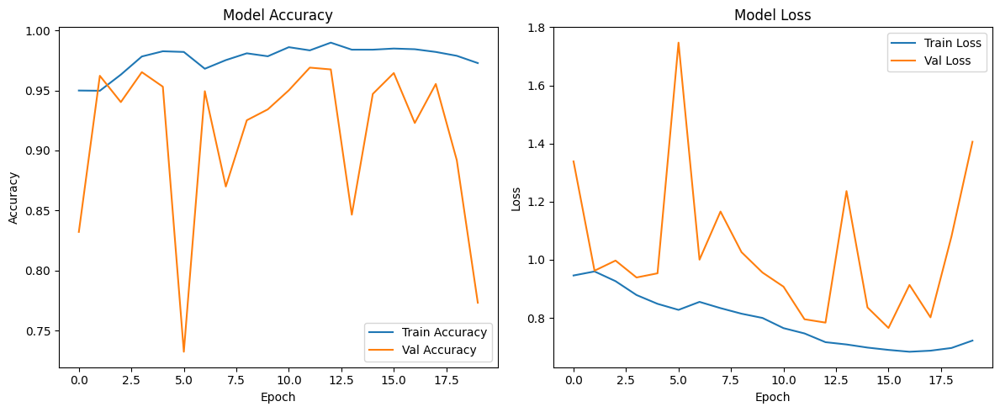

In [ ]:
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(model_class_weights.history['accuracy'], label='Train Accuracy')
plt.plot(model_class_weights.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(model_class_weights.history['loss'], label='Train Loss')
plt.plot(model_class_weights.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Did not work. Lets manually stratify data from all classes into train and validation_ds and then create the model:

In [ ]:
import os
from glob import glob

data_dir = 'data/data'
class_names = sorted(os.listdir(data_dir))  # sorted ensures consistent label order

image_paths = []
labels = []

for label, class_name in enumerate(class_names):
    class_path = os.path.join(data_dir, class_name)
    for img_file in glob(os.path.join(class_path, '*')):
        image_paths.append(img_file)
        labels.append(label)

In [ ]:
from sklearn.model_selection import train_test_split

train_paths, val_paths, train_labels, val_labels = train_test_split(
    image_paths, labels, test_size=0.2, stratify=labels, random_state=42
)

In [ ]:
import shutil

def copy_images(paths, labels, base_output_dir, class_names):
    for path, label in zip(paths, labels):
        class_name = class_names[label]
        dest_dir = os.path.join(base_output_dir, class_name)
        os.makedirs(dest_dir, exist_ok=True)
        shutil.copy2(path, dest_dir)

# Output dirs
split_dir = 'split_dir'
train_dir = os.path.join(split_dir, 'train')
val_dir = os.path.join(split_dir, 'val')

copy_images(train_paths, train_labels, train_dir, class_names)
copy_images(val_paths, val_labels, val_dir, class_names)

In [ ]:
IMG_HEIGHT = 256
IMG_WIDTH = 256
BATCH_SIZE = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    label_mode='int',
    shuffle=True
)

validation_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    label_mode='int',
    shuffle=False
)

Found 5292 files belonging to 6 classes.
Found 1323 files belonging to 6 classes.


In [ ]:
import collections

train_counts = collections.Counter()
for _, labels in train_ds.unbatch():
    train_counts[int(labels.numpy())] += 1

val_counts = collections.Counter()
for _, labels in validation_ds.unbatch():
    val_counts[int(labels.numpy())] += 1

print("Train distribution:")
for i, count in train_counts.items():
    print(f"{class_names[i]}: {count}")

print("\nValidation distribution:")
for i, count in val_counts.items():
    print(f"{class_names[i]}: {count}")

Train distribution:
Paper: 1836
.ipynb_checkpoints: 432
Metal: 824
Cardboard: 800
Glass: 800
Food_Waste: 600

Validation distribution:
.ipynb_checkpoints: 108
Cardboard: 200
Food_Waste: 150
Glass: 200
Metal: 206
Paper: 459


In [ ]:
print("Detected classes:", class_names)

Detected classes: ['.ipynb_checkpoints', 'Cardboard', 'Food_Waste', 'Glass', 'Metal', 'Paper', 'Plastic']


In [ ]:
# import shutil
# import os

# checkpoint_path = os.path.join(data_dir, '.ipynb_checkpoints')
# if os.path.exists(checkpoint_path):
#     shutil.rmtree(checkpoint_path)
#     print("✅ Deleted: .ipynb_checkpoints")
# else:
#     print("No .ipynb_checkpoints folder found.")

✅ Deleted: .ipynb_checkpoints


In [ ]:
# class_names = sorted(os.listdir(data_dir))

In [ ]:
# class_names

['Cardboard', 'Food_Waste', 'Glass', 'Metal', 'Paper', 'Plastic']

In [ ]:
import os
from glob import glob

data_dir = 'data/data'
class_names = sorted([
    name for name in os.listdir(data_dir)
    if os.path.isdir(os.path.join(data_dir, name)) and not name.startswith('.')
])  # sorted ensures consistent label order

image_paths = []
labels = []

for label, class_name in enumerate(class_names):
    class_path = os.path.join(data_dir, class_name)
    for img_file in glob(os.path.join(class_path, '*')):
        image_paths.append(img_file)
        labels.append(label)

In [ ]:
from sklearn.model_selection import train_test_split

train_paths, val_paths, train_labels, val_labels = train_test_split(
    image_paths, labels, test_size=0.2, stratify=labels, random_state=42
)

In [ ]:
import shutil

def copy_images(paths, labels, base_output_dir, class_names):
    for path, label in zip(paths, labels):
        class_name = class_names[label]
        dest_dir = os.path.join(base_output_dir, class_name)
        os.makedirs(dest_dir, exist_ok=True)
        shutil.copy2(path, dest_dir)

# Output dirs
split_dir = 'split_dir'
train_dir = os.path.join(split_dir, 'train')
val_dir = os.path.join(split_dir, 'val')

copy_images(train_paths, train_labels, train_dir, class_names)
copy_images(val_paths, val_labels, val_dir, class_names)

In [ ]:
IMG_HEIGHT = 256
IMG_WIDTH = 256
BATCH_SIZE = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    label_mode='int',
    shuffle=True
)

validation_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    label_mode='int',
    shuffle=False
)

Found 5292 files belonging to 6 classes.
Found 1323 files belonging to 6 classes.


In [ ]:
import collections

train_counts = collections.Counter()
for _, labels in train_ds.unbatch():
    train_counts[int(labels.numpy())] += 1

val_counts = collections.Counter()
for _, labels in validation_ds.unbatch():
    val_counts[int(labels.numpy())] += 1

print("Train distribution:")
for i, count in train_counts.items():
    print(f"{class_names[i]}: {count}")

print("\nValidation distribution:")
for i, count in val_counts.items():
    print(f"{class_names[i]}: {count}")

Train distribution:
Glass: 600
Cardboard: 432
Metal: 800
Plastic: 1836
Paper: 824
Food_Waste: 800

Validation distribution:
Cardboard: 108
Food_Waste: 200
Glass: 150
Metal: 200
Paper: 206
Plastic: 459


In [ ]:
import collections

# Unbatch and count class frequencies
def get_class_counts(dataset):
    counter = collections.Counter()
    for _, label in dataset.unbatch():
        counter[int(label.numpy())] += 1
    return counter

train_counts = get_class_counts(train_ds)
val_counts = get_class_counts(validation_ds)

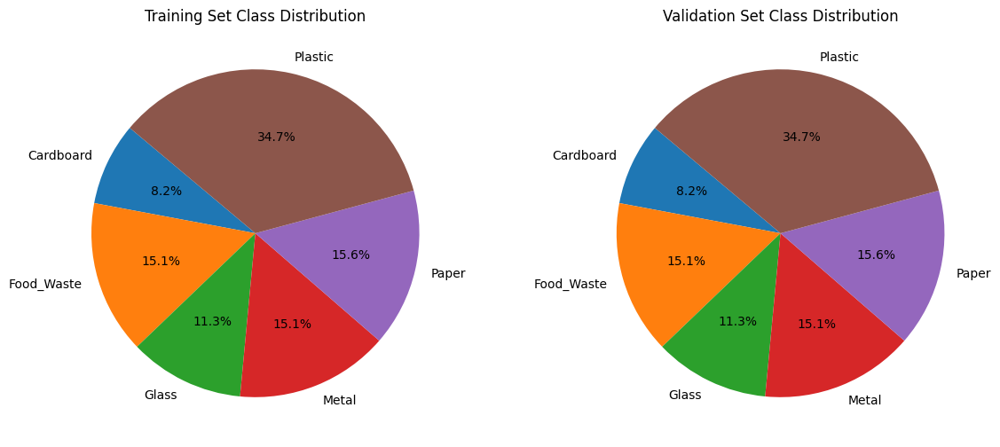

In [ ]:
import matplotlib.pyplot as plt

# Your class names
class_labels = train_ds.class_names

# Convert counts to list aligned with class indices
train_sizes = [train_counts.get(i, 0) for i in range(len(class_labels))]
val_sizes = [val_counts.get(i, 0) for i in range(len(class_labels))]

# Plot pie chart
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

ax1.pie(train_sizes, labels=class_labels, autopct='%1.1f%%', startangle=140)
ax1.set_title('Training Set Class Distribution')

ax2.pie(val_sizes, labels=class_labels, autopct='%1.1f%%', startangle=140)
ax2.set_title('Validation Set Class Distribution')

plt.show()

In [ ]:
# now we have successfully avoided class imbalance. Lets randomly check few images from train and val

In [ ]:
import random

# Unbatch and convert to list
train_images = list(train_ds.unbatch().as_numpy_iterator())
val_images = list(validation_ds.unbatch().as_numpy_iterator())

# Sample 5 random images
sampled_train = random.sample(train_images, 5)
sampled_val = random.sample(val_images, 5)

class_names = train_ds.class_names  # get class names

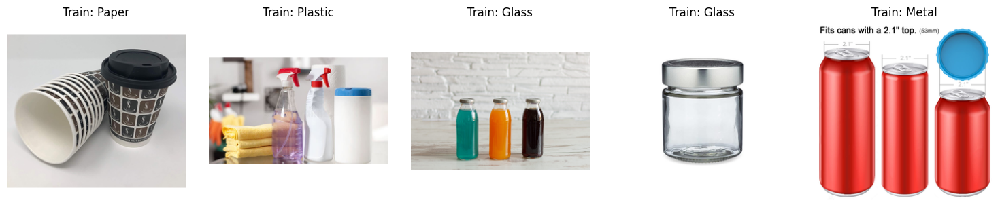

In [ ]:
plt.figure(figsize=(15, 3))
for i, (img, label) in enumerate(sampled_train):
    plt.subplot(1, 5, i + 1)
    plt.imshow(img.astype("uint8"))
    plt.title(f'Train: {class_names[label]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

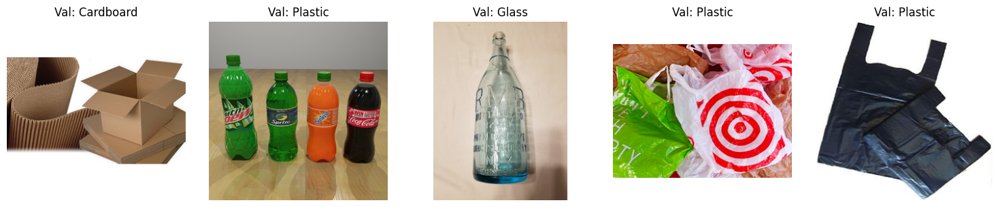

In [ ]:
plt.figure(figsize=(15, 3))
for i, (img, label) in enumerate(sampled_val):
    plt.subplot(1, 5, i + 1)
    plt.imshow(img.astype("uint8"))
    plt.title(f'Val: {class_names[label]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
# Now, since we have our splits ready lets train the model:

from keras.layers import BatchNormalization

model_manual_split = Sequential()

# First Convolutional Layer
model_manual_split.add(Conv2D(32, kernel_size=(3, 3), padding='valid', activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model_manual_split.add(BatchNormalization())  # Add Batch Normalization
model_manual_split.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid'))

# Second Convolutional Layer
model_manual_split.add(Conv2D(64, kernel_size=(3, 3), padding='valid', activation='relu'))
model_manual_split.add(BatchNormalization())  # Add Batch Normalization
model_manual_split.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid'))

# Third Convolutional Layer
model_manual_split.add(Conv2D(128, kernel_size=(3, 3), padding='valid', activation='relu'))
model_manual_split.add(BatchNormalization())  # Add Batch Normalization
model_manual_split.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid'))

# Flatten the output for the fully connected layers
model_manual_split.add(Flatten())

# Fully Connected Layers
model_manual_split.add(Dense(256, activation='relu'))
model_manual_split.add(BatchNormalization())  # Add Batch Normalization
model_manual_split.add(Dropout(0.5)) # Added dropout for regularization
model_manual_split.add(Dense(128, activation='relu'))
model_manual_split.add(BatchNormalization())  # Add Batch Normalization
model_manual_split.add(Dropout(0.5)) # Added dropout for regularization
model_manual_split.add(Dense(len(class_names), activation='softmax')) # Output layer with softmax for classification

# Print the model summary
model_manual_split.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 batch_normalization_10 (Ba  (None, 254, 254, 32)      128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 127, 127, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 batch_normalization_11 (Ba  (None, 125, 125, 64)      256       
 tchNormalization)                                               
                                                      

In [ ]:
model_manual_split.compile(optimizer='adam',
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), # output layer already has softmax --> so logits is set false
              metrics=['accuracy'])

In [ ]:
model_manual_split_histroy = model_manual_split.fit(train_ds, validation_data=validation_ds, epochs=20)

Epoch 1/20
166/166 [==============================] - 36s 183ms/step - loss: 1.9786 - accuracy: 0.3460 - val_loss: 1.5270 - val_accuracy: 0.4475
Epoch 2/20
166/166 [==============================] - 27s 155ms/step - loss: 1.5262 - accuracy: 0.4594 - val_loss: 1.9370 - val_accuracy: 0.4444
Epoch 3/20
166/166 [==============================] - 25s 148ms/step - loss: 1.2866 - accuracy: 0.5293 - val_loss: 1.5708 - val_accuracy: 0.4218
Epoch 4/20
166/166 [==============================] - 23s 133ms/step - loss: 1.1262 - accuracy: 0.5871 - val_loss: 1.3430 - val_accuracy: 0.4875
Epoch 5/20
166/166 [==============================] - 25s 149ms/step - loss: 1.0139 - accuracy: 0.6370 - val_loss: 1.2244 - val_accuracy: 0.5676
Epoch 6/20
166/166 [==============================] - 25s 146ms/step - loss: 0.8480 - accuracy: 0.7028 - val_loss: 1.2410 - val_accuracy: 0.5593
Epoch 7/20
166/166 [==============================] - 24s 136ms/step - loss: 0.7657 - accuracy: 0.7315 - val_loss: 1.4023 - val_ac

In [ ]:
# model_manual_split.save('models/model_manual_split')

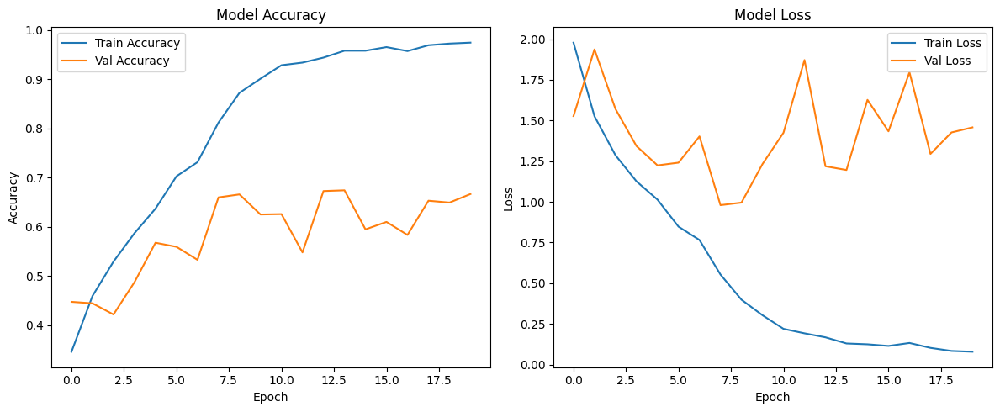

In [ ]:
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(model_manual_split_histroy.history['accuracy'], label='Train Accuracy')
plt.plot(model_manual_split_histroy.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(model_manual_split_histroy.history['loss'], label='Train Loss')
plt.plot(model_manual_split_histroy.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
model_manual_split.save('models/model_manual_split')

INFO:tensorflow:Assets written to: models/model_manual_split/assets


INFO:tensorflow:Assets written to: models/model_manual_split/assets


In [ ]:
from tensorflow.keras import regularizers

# L2 regularization strength
l2_strength = 0.001

model_l2 = Sequential()

# First Convolutional Layer
model_l2.add(Conv2D(32, (3, 3), padding='valid', activation='relu',
                 kernel_regularizer=regularizers.l2(l2_strength),
                 input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model_l2.add(BatchNormalization())
model_l2.add(MaxPooling2D((2, 2), strides=2, padding='valid'))

# Second Convolutional Layer
model_l2.add(Conv2D(64, (3, 3), padding='valid', activation='relu',
                 kernel_regularizer=regularizers.l2(l2_strength)))
model_l2.add(BatchNormalization())
model_l2.add(MaxPooling2D((2, 2), strides=2, padding='valid'))

# Third Convolutional Layer
model_l2.add(Conv2D(128, (3, 3), padding='valid', activation='relu',
                 kernel_regularizer=regularizers.l2(l2_strength)))
model_l2.add(BatchNormalization())
model_l2.add(MaxPooling2D((2, 2), strides=2, padding='valid'))

# Flatten the output
model_l2.add(Flatten())

# Fully Connected Layers
model_l2.add(Dense(256, activation='relu',
                kernel_regularizer=regularizers.l2(l2_strength)))
model_l2.add(BatchNormalization())
model_l2.add(Dropout(0.5))

model_l2.add(Dense(128, activation='relu',
                kernel_regularizer=regularizers.l2(l2_strength)))
model_l2.add(BatchNormalization())
model_l2.add(Dropout(0.5))

# Output layer with softmax (since you're not using from_logits=True)
model_l2.add(Dense(len(class_names), activation='softmax'))

# Print model summary
model_l2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 batch_normalization_15 (Ba  (None, 254, 254, 32)      128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 127, 127, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 125, 125, 64)      18496     
                                                                 
 batch_normalization_16 (Ba  (None, 125, 125, 64)      256       
 tchNormalization)                                               
                                                      

In [ ]:
model_l2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',  # from_logits=False by default
    metrics=['accuracy']
)

In [ ]:
model_l2_history = model_l2.fit(train_ds, validation_data=validation_ds, epochs=20)

Epoch 1/20
166/166 [==============================] - 21s 101ms/step - loss: 3.0103 - accuracy: 0.3201 - val_loss: 2.2229 - val_accuracy: 0.4762
Epoch 2/20
166/166 [==============================] - 17s 101ms/step - loss: 2.5151 - accuracy: 0.4433 - val_loss: 2.1646 - val_accuracy: 0.5064
Epoch 3/20
166/166 [==============================] - 17s 99ms/step - loss: 2.2959 - accuracy: 0.5215 - val_loss: 1.9817 - val_accuracy: 0.6062
Epoch 4/20
166/166 [==============================] - 17s 100ms/step - loss: 2.0283 - accuracy: 0.5990 - val_loss: 1.9605 - val_accuracy: 0.6274
Epoch 5/20
166/166 [==============================] - 17s 99ms/step - loss: 1.9714 - accuracy: 0.6370 - val_loss: 2.1130 - val_accuracy: 0.5805
Epoch 6/20
166/166 [==============================] - 17s 100ms/step - loss: 1.8011 - accuracy: 0.6869 - val_loss: 2.1363 - val_accuracy: 0.5707
Epoch 7/20
166/166 [==============================] - 17s 99ms/step - loss: 1.6240 - accuracy: 0.7502 - val_loss: 1.9699 - val_accur

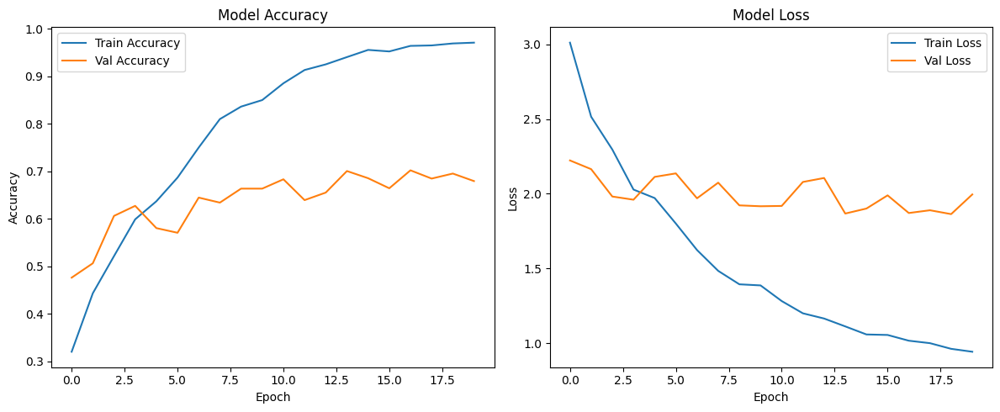

In [ ]:
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(model_l2_history.history['accuracy'], label='Train Accuracy')
plt.plot(model_l2_history.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(model_l2_history.history['loss'], label='Train Loss')
plt.plot(model_l2_history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Lets try using class_weights:

from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Flatten all training labels
train_labels_flat = [label for _, label in train_ds.unbatch()]

# Convert to numpy array
train_labels_np = np.array([int(label.numpy()) for label in train_labels_flat])

# Get class names (optional, for reference)
class_names = train_ds.class_names

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_labels_np),
    y=train_labels_np
)

# Map to dictionary format required by model.fit()
class_weights_dict = {i: weight for i, weight in enumerate(class_weights)}

print("Class weights:", class_weights_dict)


Class weights: {0: 2.0420524691358026, 1: 1.1027083333333334, 2: 1.4702777777777778, 3: 1.1027083333333334, 4: 1.0692929292929292, 5: 0.48048293391430646}


In [ ]:
class_weights_model_history = model_l2.fit(train_ds, validation_data=validation_ds, epochs=20, class_weight=class_weights_dict)

Epoch 1/20
166/166 [==============================] - 18s 101ms/step - loss: 0.9187 - accuracy: 0.9754 - val_loss: 1.8593 - val_accuracy: 0.6848
Epoch 2/20
166/166 [==============================] - 17s 100ms/step - loss: 0.9201 - accuracy: 0.9701 - val_loss: 2.0071 - val_accuracy: 0.6818
Epoch 3/20
166/166 [==============================] - 17s 100ms/step - loss: 0.8913 - accuracy: 0.9739 - val_loss: 1.9021 - val_accuracy: 0.6878
Epoch 4/20
166/166 [==============================] - 17s 100ms/step - loss: 0.8699 - accuracy: 0.9779 - val_loss: 1.8504 - val_accuracy: 0.6818
Epoch 5/20
166/166 [==============================] - 17s 100ms/step - loss: 0.9057 - accuracy: 0.9632 - val_loss: 2.1528 - val_accuracy: 0.6546
Epoch 6/20
166/166 [==============================] - 17s 99ms/step - loss: 0.9261 - accuracy: 0.9543 - val_loss: 1.9489 - val_accuracy: 0.6342
Epoch 7/20
166/166 [==============================] - 17s 99ms/step - loss: 0.9217 - accuracy: 0.9618 - val_loss: 1.9981 - val_accu

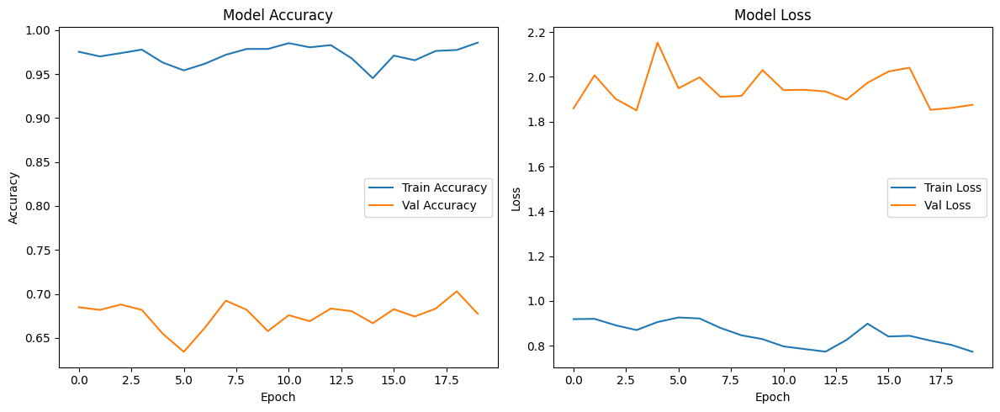

In [ ]:
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(class_weights_model_history.history['accuracy'], label='Train Accuracy')
plt.plot(class_weights_model_history.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(class_weights_model_history.history['loss'], label='Train Loss')
plt.plot(class_weights_model_history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
model_l2.save('models/model_l2')

INFO:tensorflow:Assets written to: models/model_l2/assets


INFO:tensorflow:Assets written to: models/model_l2/assets


In [ ]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
from sklearn.utils import class_weight
import numpy as np
import os

# Assuming `train_labels` contains labels from manually stratified dataset
# And class_names = ['Cardboard', 'Food_Waste', 'Glass', 'Metal', 'Paper', 'Plastic']
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_labels),
    y=train_labels
)

# Convert to dictionary format required by Keras
class_weights = {i: weight for i, weight in enumerate(class_weights_array)}

# Underweight Plastic class (index 5)
class_weights[5] *= 0.3

# Model Architecture with BatchNorm, Dropout, and L2 regularization
model_plastic = Sequential()

# Conv Block 1
model_plastic.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(256, 256, 3), kernel_regularizer=l2(0.001)))
model_plastic.add(BatchNormalization())
model_plastic.add(MaxPooling2D(pool_size=(2, 2)))

# Conv Block 2
model_plastic.add(Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001)))
model_plastic.add(BatchNormalization())
model_plastic.add(MaxPooling2D(pool_size=(2, 2)))

# Conv Block 3
model_plastic.add(Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001)))
model_plastic.add(BatchNormalization())
model_plastic.add(MaxPooling2D(pool_size=(2, 2)))

# FC Layers
model_plastic.add(Flatten())
model_plastic.add(Dense(256, activation='relu', kernel_regularizer=l2(0.001)))
model_plastic.add(BatchNormalization())
model_plastic.add(Dropout(0.5))
model_plastic.add(Dense(128, activation='relu', kernel_regularizer=l2(0.001)))
model_plastic.add(BatchNormalization())
model_plastic.add(Dropout(0.5))
model_plastic.add(Dense(6, activation='softmax'))  # 6 classes

# Compile with categorical crossentropy and metrics
model_plastic.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
model_plastic_history = model_plastic.fit(
    train_ds,
    validation_data=validation_ds,
    epochs=20,
    class_weight=class_weights  # this line enables class re-weighting
)


Epoch 1/20
166/166 [==============================] - 23s 99ms/step - loss: 3.5878 - accuracy: 0.2721 - val_loss: 4.7465 - val_accuracy: 0.1965
Epoch 2/20
166/166 [==============================] - 16s 92ms/step - loss: 3.1916 - accuracy: 0.3146 - val_loss: 4.0201 - val_accuracy: 0.2207
Epoch 3/20
166/166 [==============================] - 15s 91ms/step - loss: 3.1617 - accuracy: 0.2984 - val_loss: 3.6369 - val_accuracy: 0.2366
Epoch 4/20
166/166 [==============================] - 15s 91ms/step - loss: 2.8829 - accuracy: 0.3375 - val_loss: 4.8995 - val_accuracy: 0.1814
Epoch 5/20
166/166 [==============================] - 15s 90ms/step - loss: 2.5461 - accuracy: 0.3549 - val_loss: 2.9210 - val_accuracy: 0.2895
Epoch 6/20
166/166 [==============================] - 15s 90ms/step - loss: 2.3309 - accuracy: 0.3745 - val_loss: 2.8717 - val_accuracy: 0.3401
Epoch 7/20
166/166 [==============================] - 16s 94ms/step - loss: 2.3564 - accuracy: 0.3730 - val_loss: 3.0092 - val_accuracy:

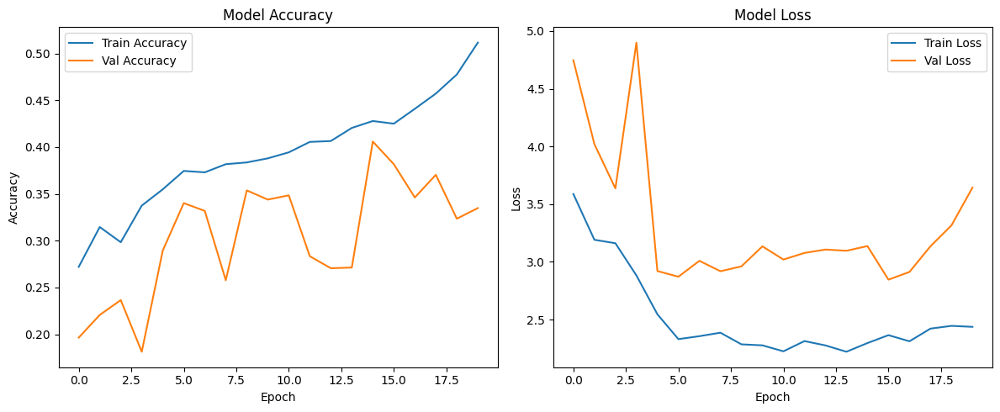

In [ ]:
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(model_plastic_history.history['accuracy'], label='Train Accuracy')
plt.plot(model_plastic_history.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(model_plastic_history.history['loss'], label='Train Loss')
plt.plot(model_plastic_history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
model_plastic = model_plastic.save('models/model_plastic')

INFO:tensorflow:Assets written to: models/model_plastic/assets


INFO:tensorflow:Assets written to: models/model_plastic/assets


In [ ]:
# Did not work well. May be needs more variable data for training

In [ ]:
IMG_HEIGHT = 256
IMG_WIDTH = 256
BATCH_SIZE = 32

train_dir = 'split_dir/train'
val_dir = 'split_dir/val'

train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    label_mode='int',
    shuffle=True
)

validation_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    label_mode='int',
    shuffle=False
)

Found 5293 files belonging to 6 classes.


2025-06-20 09:43:58.212030: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.
2025-06-20 09:43:58.212030: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.
2025-06-20 09:43:58.218684: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.


Found 1323 files belonging to 6 classes.


## **4. Data Augmentation** <font color=red> [optional] </font><br>

#### **4.1 Create a Data Augmentation Pipeline**

##### **4.1.1**
Define augmentation steps for the datasets.

Augment and resample the images.
In case of class imbalance, you can also perform adequate undersampling on the majority class and augment those images to ensure consistency in the input datasets for both classes.

Augment the images.

1. Create a function to augment the images

2. Create the augmented training dataset

Note that both the steps are taken care-off at one go below.


In [ ]:
# Lets try data_augmentaion

# # Define augmentation steps to augment images

# For this lets create a new augmented_dataset for training:

# Assume original train_ds is loaded already

# Define augmentation
from tensorflow.keras import Sequential
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomContrast

data_augmentation = Sequential([
    RandomFlip("horizontal"),
    RandomRotation(0.15),
    RandomZoom(0.1),
    RandomContrast(0.1),
])

# Apply augmentation to create a separate dataset
train_ds_aug = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))
# Note x is the input_tensor and y is the label above.

In [ ]:
# Lets check the number of images in train_ds_aug:

# Count number of samples in train_ds
num_images_train = 0
for images, _ in train_ds_aug:
    num_images_train += images.shape[0]

print(f"Number of images in train_ds: {num_images_train}")

Number of images in train_ds: 5293


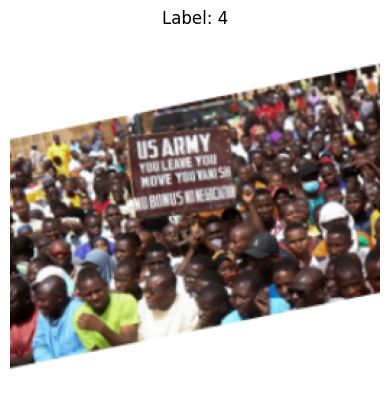

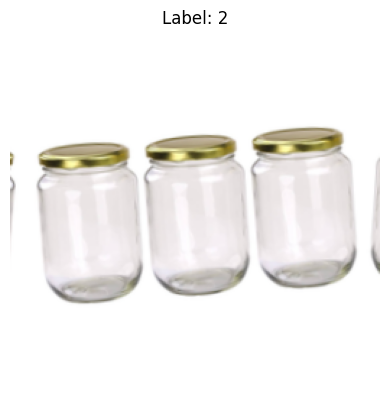

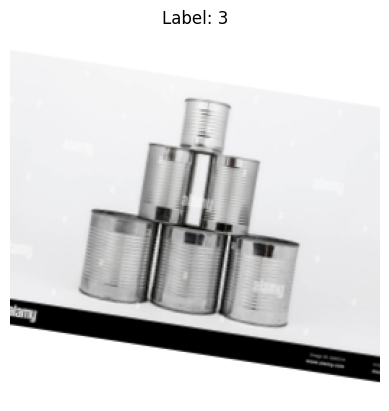

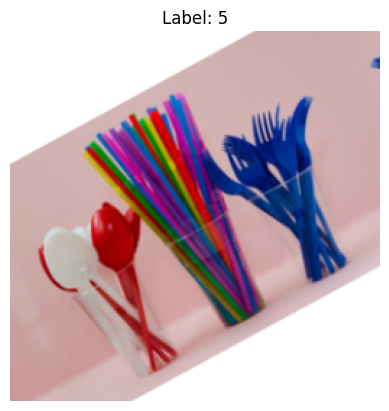

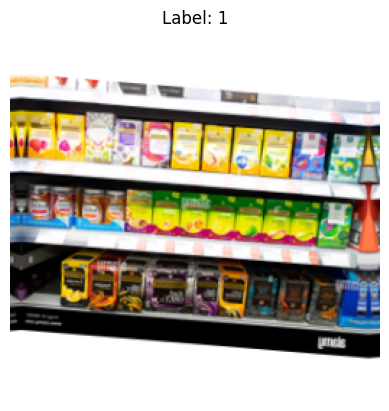

In [ ]:
# Lets visualize few of the images from the augmented training data:
import matplotlib.pyplot as plt

for images, labels in train_ds_aug.take(1):
    for i in range(5):
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"Label: {labels[i].numpy()}")
        plt.axis("off")
        plt.show()

In [ ]:
# Lets load all the models:
from tensorflow.keras.models import load_model

model_l2 = model = load_model('models/model_l2')
model_manual_split = load_model('models/model_manual_split')
model_plastic = load_model('models/model_plastic')
new_model1 = load_model('models/new_model1')
new_model2 = load_model('models/new_model2')

##### **4.1.2**

Train the model on the new augmented dataset.

In [ ]:
# Lets train all the models with augmented data:

# model_l2:
model_l2.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
aug_model_l2_history = model_l2.fit(
    train_ds_aug,
    validation_data=validation_ds,
    epochs=20)

Epoch 1/20


2025-06-20 09:47:27.194646: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2025-06-20 09:47:27.334653: W external/local_xla/xla/stream_executor/gpu/redzone_allocator.cc:322] INTERNAL: couldn't get temp CUBIN file name
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2025-06-20 09:47:29.524103: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.
2025-06-20 09:47:30.121250: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f52cd0b4890 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-06-20 09:47:30.122779: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): Quadro P5000, Compute Capability 6.1
2025-06-20 09:47:30.130675: I tensorflow/compiler/mlir/tensorflow/utils/dump_ml

166/166 [==============================] - 120s 664ms/step - loss: 3.7518 - accuracy: 0.4060 - val_loss: 3.2812 - val_accuracy: 0.4822
Epoch 2/20
166/166 [==============================] - 95s 572ms/step - loss: 2.9671 - accuracy: 0.4574 - val_loss: 2.4239 - val_accuracy: 0.5488
Epoch 3/20
166/166 [==============================] - 104s 627ms/step - loss: 2.5471 - accuracy: 0.4937 - val_loss: 2.4091 - val_accuracy: 0.5246
Epoch 4/20
166/166 [==============================] - 123s 740ms/step - loss: 2.3308 - accuracy: 0.5220 - val_loss: 2.6408 - val_accuracy: 0.3915
Epoch 5/20
166/166 [==============================] - 114s 689ms/step - loss: 2.2708 - accuracy: 0.5324 - val_loss: 3.7093 - val_accuracy: 0.2343
Epoch 6/20
166/166 [==============================] - 106s 639ms/step - loss: 2.2661 - accuracy: 0.5330 - val_loss: 2.1894 - val_accuracy: 0.5329
Epoch 7/20
166/166 [==============================] - 107s 645ms/step - loss: 2.1756 - accuracy: 0.5381 - val_loss: 2.3135 - val_accurac

KeyboardInterrupt: 

In [ ]:
# Stopped training since the results were fluctuating too much than expectation.

In [ ]:
import os

data_dir = "split_dir/train"  # same path you used in image_dataset_from_directory
class_names = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))])

print("Class names:", class_names)


Class names: ['Cardboard', 'Food_Waste', 'Glass', 'Metal', 'Paper', 'Plastic']


In [ ]:
# Lets create a simpler model:

# Now, since we have our splits ready lets train the model:

class_names = train.class_names # because class names are not going to change during augmentation.

from keras.layers import BatchNormalization

aug_model_manual_split = Sequential()

# First Convolutional Layer
aug_model_manual_split.add(Conv2D(32, kernel_size=(3, 3), padding='valid', activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
aug_model_manual_split.add(BatchNormalization())  # Add Batch Normalization
aug_model_manual_split.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid'))

# Second Convolutional Layer
aug_model_manual_split.add(Conv2D(64, kernel_size=(3, 3), padding='valid', activation='relu'))
aug_model_manual_split.add(BatchNormalization())  # Add Batch Normalization
aug_model_manual_split.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid'))

# Third Convolutional Layer
aug_model_manual_split.add(Conv2D(128, kernel_size=(3, 3), padding='valid', activation='relu'))
aug_model_manual_split.add(BatchNormalization())  # Add Batch Normalization
aug_model_manual_split.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid'))

# Flatten the output for the fully connected layers
aug_model_manual_split.add(Flatten())

# Fully Connected Layers
aug_model_manual_split.add(Dense(256, activation='relu'))
aug_model_manual_split.add(BatchNormalization())  # Add Batch Normalization
aug_model_manual_split.add(Dropout(0.5)) # Added dropout for regularization
aug_model_manual_split.add(Dense(128, activation='relu'))
aug_model_manual_split.add(BatchNormalization())  # Add Batch Normalization
aug_model_manual_split.add(Dropout(0.5)) # Added dropout for regularization
aug_model_manual_split.add(Dense(len(class_names), activation='softmax')) # Output layer with softmax for classification

# Print the model summary
aug_model_manual_split.summary()

NameError: name 'train' is not defined

In [ ]:
aug_model_manual_split.compile(optimizer='adam',
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), # output layer already has softmax --> so logits is set false
              metrics=['accuracy'])

In [ ]:
aug_model_manual_split = aug_model_manual_split.fit(train_ds_aug, validation_data=validation_ds, epochs=20)

Epoch 1/20


2025-06-20 10:16:09.338665: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.


166/166 [==============================] - 97s 554ms/step - loss: 12.8154 - accuracy: 0.0818 - val_loss: 14.7184 - val_accuracy: 0.0642
Epoch 2/20
166/166 [==============================] - 94s 562ms/step - loss: 8.9615 - accuracy: 0.1457 - val_loss: 7.5660 - val_accuracy: 0.1875
Epoch 3/20
166/166 [==============================] - 90s 539ms/step - loss: 7.3238 - accuracy: 0.1419 - val_loss: 6.1139 - val_accuracy: 0.1610
Epoch 4/20
166/166 [==============================] - 88s 532ms/step - loss: 6.7224 - accuracy: 0.1447 - val_loss: 7.2065 - val_accuracy: 0.1648
Epoch 5/20
166/166 [==============================] - 93s 558ms/step - loss: 6.4177 - accuracy: 0.1266 - val_loss: 5.3494 - val_accuracy: 0.1406
Epoch 6/20
166/166 [==============================] - 90s 542ms/step - loss: 5.9518 - accuracy: 0.1113 - val_loss: 4.9479 - val_accuracy: 0.1489
Epoch 7/20
166/166 [==============================] - 93s 558ms/step - loss: 5.9740 - accuracy: 0.1124 - val_loss: 5.0166 - val_accuracy: 0

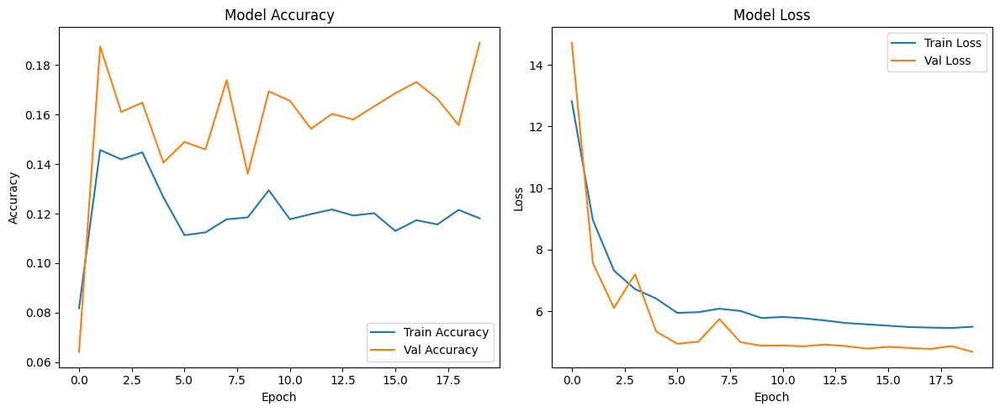

In [ ]:
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(aug_model_manual_split.history['accuracy'], label='Train Accuracy')
plt.plot(aug_model_manual_split.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(aug_model_manual_split.history['loss'], label='Train Loss')
plt.plot(aug_model_manual_split.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Seems like the model got furhter confused because of image augmentation in this case. This is the reason the accuracy is
# low. Lets reduce the augmentation stringency and retrain.

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
b
# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, verbose=1)

# Compile model (example with L2 regularization)
from tensorflow.keras import layers, models, regularizers

model = models.Sequential([
    layers.Input(shape=(256, 256, 3)),
    layers.Conv2D(32, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.MaxPooling2D(),
    layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.3),
    layers.Dense(6, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train
history = model.fit(
    train_ds_aug,
    validation_data=validation_ds,
    epochs=50,
    callbacks=[early_stop, lr_scheduler],
    class_weight=class_weights_dict
)
# Lets try one last time

Epoch 1/50
166/166 [==============================] - 95s 556ms/step - loss: 125.1777 - accuracy: 0.2088 - val_loss: 2.6307 - val_accuracy: 0.2094 - lr: 0.0010
Epoch 2/50
166/166 [==============================] - 91s 543ms/step - loss: 2.6249 - accuracy: 0.1751 - val_loss: 2.5789 - val_accuracy: 0.2638 - lr: 0.0010
Epoch 3/50
166/166 [==============================] - 87s 521ms/step - loss: 2.5711 - accuracy: 0.1254 - val_loss: 2.5636 - val_accuracy: 0.1557 - lr: 0.0010
Epoch 4/50
166/166 [==============================] - 86s 518ms/step - loss: 2.5503 - accuracy: 0.1340 - val_loss: 2.5261 - val_accuracy: 0.1761 - lr: 0.0010
Epoch 5/50
166/166 [==============================] - 94s 568ms/step - loss: 2.5229 - accuracy: 0.1674 - val_loss: 2.5368 - val_accuracy: 0.1383 - lr: 0.0010
Epoch 6/50
166/166 [==============================] - 102s 613ms/step - loss: 2.4961 - accuracy: 0.1459 - val_loss: 2.4855 - val_accuracy: 0.1542 - lr: 0.0010
Epoch 7/50
111/166 [===================>.........

KeyboardInterrupt: 

In [ ]:
# So augmentation is not working. Lets settle with our first model that we generated using the split
# for the first time. That gives and average of 68% accuracy. Lets test that model on our random data.

1/1 [==============================] - 0s 25ms/step


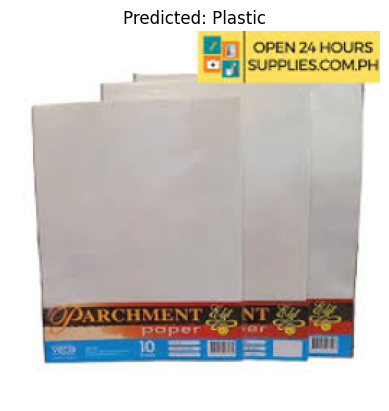

1/1 [==============================] - 0s 26ms/step


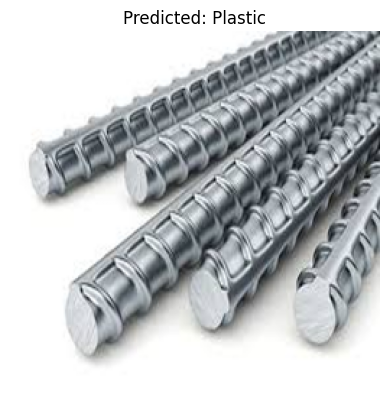

1/1 [==============================] - 0s 27ms/step


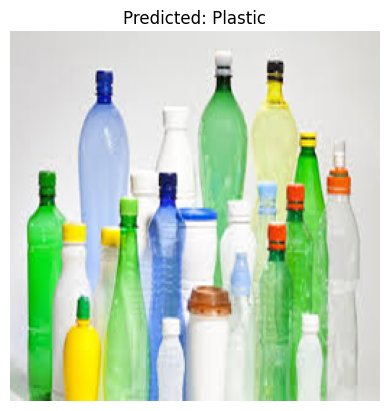

1/1 [==============================] - 0s 29ms/step


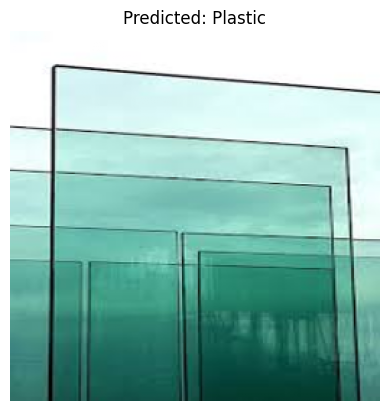

1/1 [==============================] - 0s 24ms/step


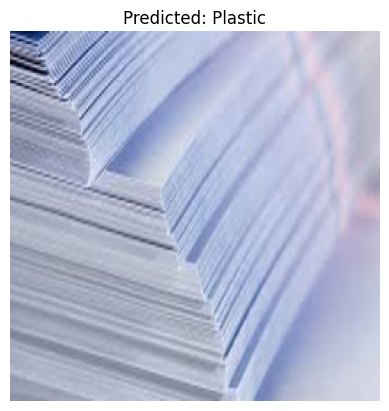

In [ ]:
# Lets check how the models are performing to unknown data:
# Lets check the prediction of the model on few of the random images:
import os
import random
from PIL import Image

source_folder = 'sample_images'
image_paths = [os.path.join(source_folder, fname) for fname in os.listdir(source_folder)]
sample_images = random.sample(image_paths, 5)

# Preprocessing of the random images:

IMG_HEIGHT = 256
IMG_WIDTH = 256

def loadandpreprocess(image_path):
  img = Image.open(image_path).convert('RGB')
  img = img.resize((IMG_WIDTH, IMG_HEIGHT))
  img_array = np.array(img) / 255.0
  return img_array

# Predict and visualize sample images:
for image in sample_images:
  img_array = loadandpreprocess(image)
  img_array = np.expand_dims(img_array, axis=0)
  prediction = model_manual_split.predict(img_array)
  predicted_class = class_names[np.argmax(prediction)]

  # Display
  plt.imshow(np.squeeze(img_array,axis=0))
  plt.title(f"Predicted: {predicted_class}")
  plt.axis('off')
  plt.show()

1/1 [==============================] - 0s 320ms/step


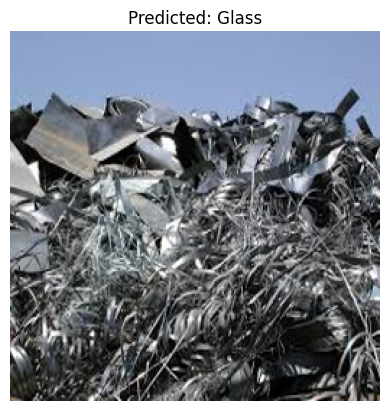

1/1 [==============================] - 0s 28ms/step


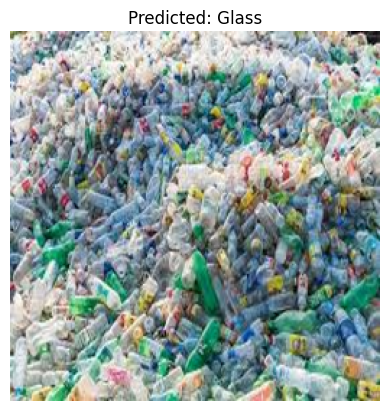

1/1 [==============================] - 0s 37ms/step


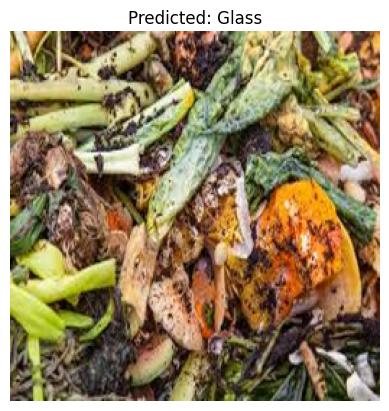

1/1 [==============================] - 0s 32ms/step


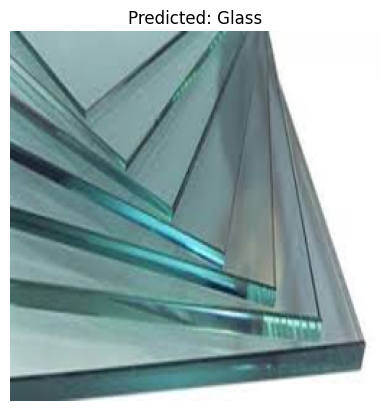

1/1 [==============================] - 0s 36ms/step


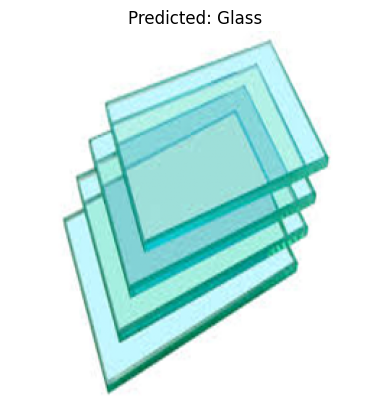

In [ ]:
# Lets check how the models are performing to unknown data:
# Lets check the prediction of the model on few of the random images:
import os
import random
from PIL import Image

source_folder = 'sample_images'
image_paths = [os.path.join(source_folder, fname) for fname in os.listdir(source_folder)]
sample_images = random.sample(image_paths, 5)

# Preprocessing of the random images:

IMG_HEIGHT = 256
IMG_WIDTH = 256

def loadandpreprocess(image_path):
  img = Image.open(image_path).convert('RGB')
  img = img.resize((IMG_WIDTH, IMG_HEIGHT))
  img_array = np.array(img) / 255.0
  return img_array

# Predict and visualize sample images:
for image in sample_images:
  img_array = loadandpreprocess(image)
  img_array = np.expand_dims(img_array, axis=0)
  prediction = model_plastic.predict(img_array)
  predicted_class = class_names[np.argmax(prediction)]

  # Display
  plt.imshow(np.squeeze(img_array,axis=0))
  plt.title(f"Predicted: {predicted_class}")
  plt.axis('off')
  plt.show()

1/1 [==============================] - 0s 174ms/step


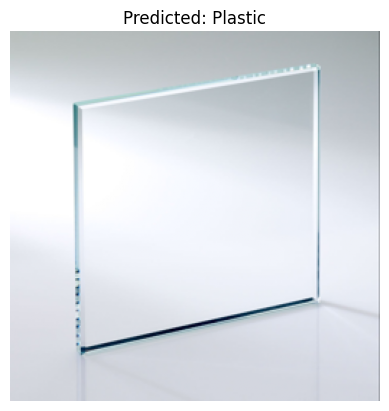

1/1 [==============================] - 0s 27ms/step


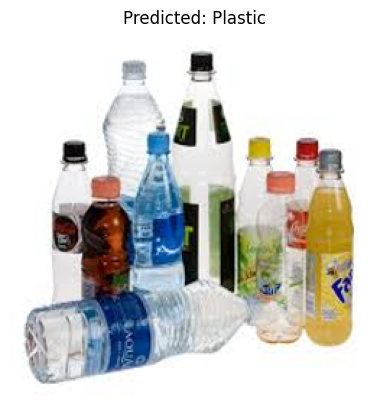

1/1 [==============================] - 0s 30ms/step


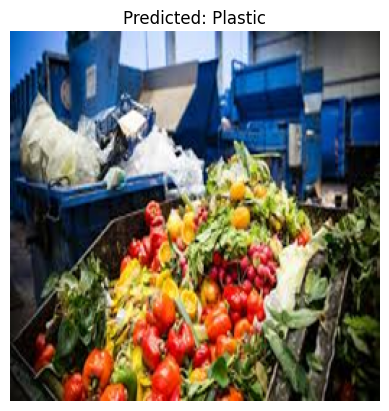

1/1 [==============================] - 0s 37ms/step


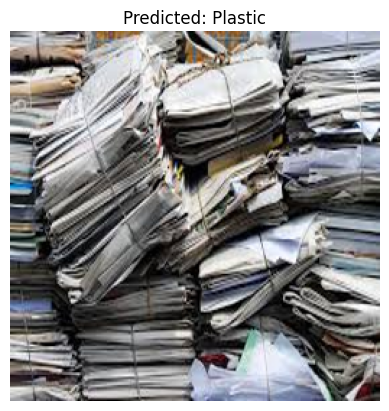

1/1 [==============================] - 0s 33ms/step


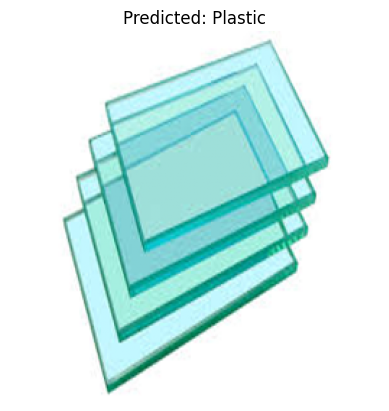

In [ ]:
# Lets check how the models are performing to unknown data:
# Lets check the prediction of the model on few of the random images:
import os
import random
from PIL import Image

source_folder = 'sample_images'
image_paths = [os.path.join(source_folder, fname) for fname in os.listdir(source_folder)]
sample_images = random.sample(image_paths, 5)

# Preprocessing of the random images:

IMG_HEIGHT = 256
IMG_WIDTH = 256

def loadandpreprocess(image_path):
  img = Image.open(image_path).convert('RGB')
  img = img.resize((IMG_WIDTH, IMG_HEIGHT))
  img_array = np.array(img) / 255.0
  return img_array

# Predict and visualize sample images:
for image in sample_images:
  img_array = loadandpreprocess(image)
  img_array = np.expand_dims(img_array, axis=0)
  prediction = model_l2.predict(img_array)
  predicted_class = class_names[np.argmax(prediction)]

  # Display
  plt.imshow(np.squeeze(img_array,axis=0))
  plt.title(f"Predicted: {predicted_class}")
  plt.axis('off')
  plt.show()

1/1 [==============================] - 0s 179ms/step


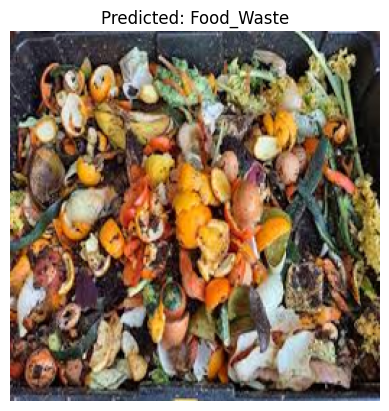

1/1 [==============================] - 0s 27ms/step


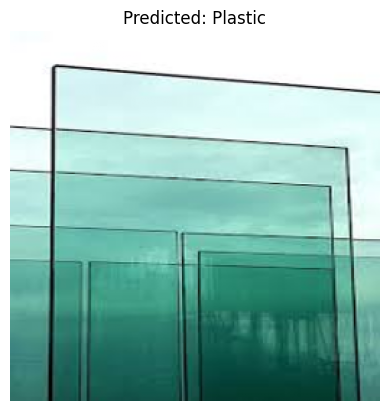

1/1 [==============================] - 0s 26ms/step


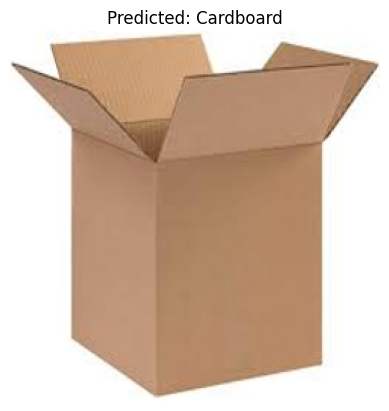

1/1 [==============================] - 0s 27ms/step


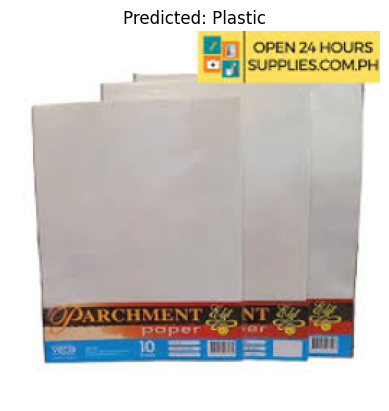

1/1 [==============================] - 0s 27ms/step


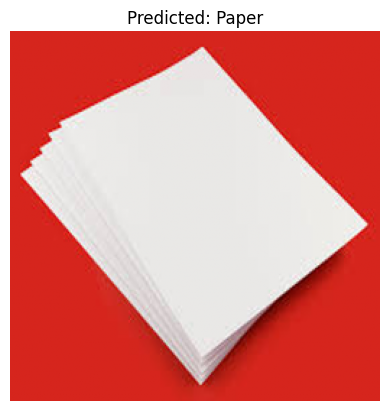

In [ ]:
# Lets check how the models are performing to unknown data:
# Lets check the prediction of the model on few of the random images:
import os
import random
from PIL import Image

source_folder = 'sample_images'
image_paths = [os.path.join(source_folder, fname) for fname in os.listdir(source_folder)]
sample_images = random.sample(image_paths, 5)

# Preprocessing of the random images:

IMG_HEIGHT = 256
IMG_WIDTH = 256

def loadandpreprocess(image_path):
  img = Image.open(image_path).convert('RGB')
  img = img.resize((IMG_WIDTH, IMG_HEIGHT))
  img_array = np.array(img) / 255.0
  return img_array

# Predict and visualize sample images:
for image in sample_images:
  img_array = loadandpreprocess(image)
  img_array = np.expand_dims(img_array, axis=0)
  prediction = new_model1.predict(img_array)
  predicted_class = class_names[np.argmax(prediction)]

  # Display
  plt.imshow(np.squeeze(img_array,axis=0))
  plt.title(f"Predicted: {predicted_class}")
  plt.axis('off')
  plt.show()

1/1 [==============================] - 0s 170ms/step


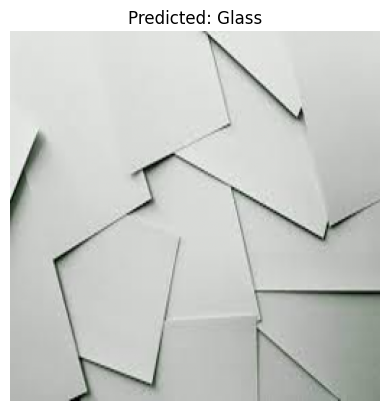

1/1 [==============================] - 0s 23ms/step


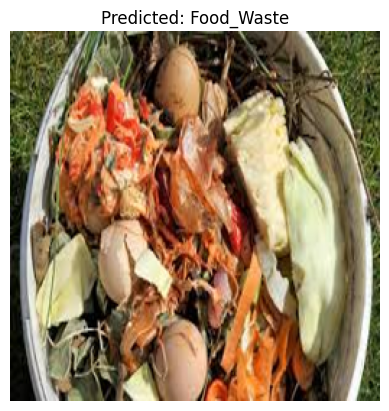

1/1 [==============================] - 0s 27ms/step


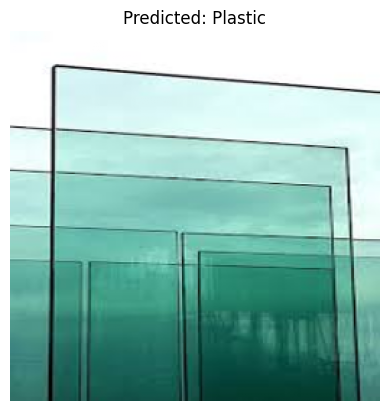

1/1 [==============================] - 0s 27ms/step


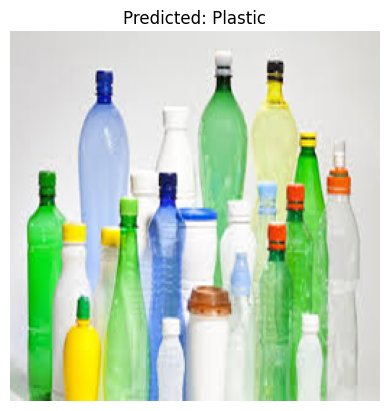

1/1 [==============================] - 0s 26ms/step


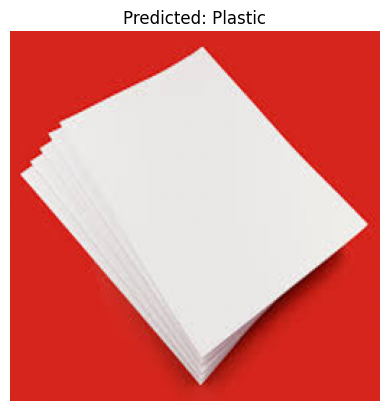

In [ ]:
# Lets check how the models are performing to unknown data:
# Lets check the prediction of the model on few of the random images:
import os
import random
from PIL import Image

source_folder = 'sample_images'
image_paths = [os.path.join(source_folder, fname) for fname in os.listdir(source_folder)]
sample_images = random.sample(image_paths, 5)

# Preprocessing of the random images:

IMG_HEIGHT = 256
IMG_WIDTH = 256

def loadandpreprocess(image_path):
  img = Image.open(image_path).convert('RGB')
  img = img.resize((IMG_WIDTH, IMG_HEIGHT))
  img_array = np.array(img) / 255.0
  return img_array

# Predict and visualize sample images:
for image in sample_images:
  img_array = loadandpreprocess(image)
  img_array = np.expand_dims(img_array, axis=0)
  prediction = new_model2.predict(img_array)
  predicted_class = class_names[np.argmax(prediction)]

  # Display
  plt.imshow(np.squeeze(img_array,axis=0))
  plt.title(f"Predicted: {predicted_class}")
  plt.axis('off')
  plt.show()

1/1 [==============================] - 0s 25ms/step


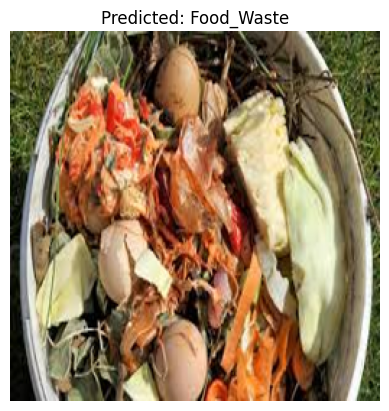

1/1 [==============================] - 0s 25ms/step


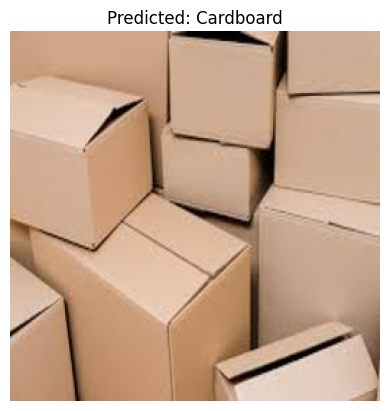

1/1 [==============================] - 0s 81ms/step


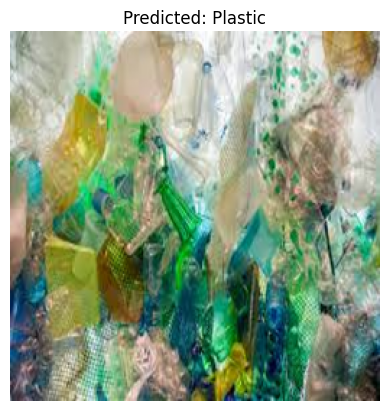

1/1 [==============================] - 0s 125ms/step


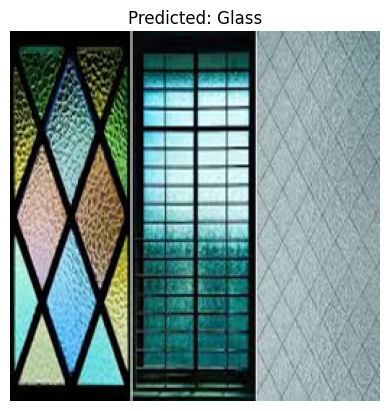

1/1 [==============================] - 0s 75ms/step


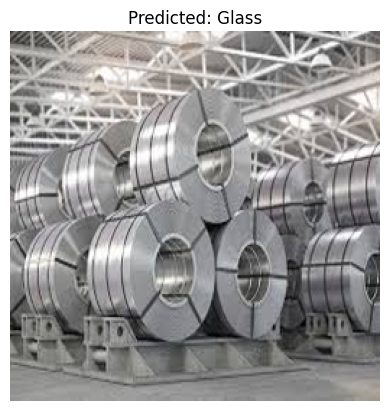

In [ ]:
# Lets check how the models are performing to unknown data:
# Lets check the prediction of the model on few of the random images:
import os
import random
from PIL import Image

source_folder = 'sample_images'
image_paths = [os.path.join(source_folder, fname) for fname in os.listdir(source_folder)]
sample_images = random.sample(image_paths, 5)

# Preprocessing of the random images:

IMG_HEIGHT = 256
IMG_WIDTH = 256

def loadandpreprocess(image_path):
  img = Image.open(image_path).convert('RGB')
  img = img.resize((IMG_WIDTH, IMG_HEIGHT))
  img_array = np.array(img) / 255.0
  return img_array

# Predict and visualize sample images:
for image in sample_images:
  img_array = loadandpreprocess(image)
  img_array = np.expand_dims(img_array, axis=0)
  prediction = new_model2.predict(img_array)
  predicted_class = class_names[np.argmax(prediction)]

  # Display
  plt.imshow(np.squeeze(img_array,axis=0))
  plt.title(f"Predicted: {predicted_class}")
  plt.axis('off')
  plt.show()

## **5. Conclusions** <font color = red> [5 marks]</font>

#### **5.1 Conclude with outcomes and insights gained** <font color =red> [5 marks] </font>

* Report your findings about the data
* Report model training results

# Waste Material Segregation for Improving Waste Management

> This project implements a Convolutional Neural Network (CNN) based system to classify waste materials into different categories to improve waste management efficiency and sustainability.

## Table of Contents
* [General Info](#general-information)
* [Technologies Used](#technologies-used)
* [Conclusions](#conclusions)
* [Acknowledgements](#acknowledgements)
<!-- You can include any other section that is pertinent to your problem -->

## General Information
- What is the background of the project?<br>
	- Effective waste segregation is a critical step in recycling and reducing landfill waste. This project aims to automate this process using computer vision.
- What is the business probem that your project is trying to solve?<br>
	- The project addresses the challenge of accurately identifying and sorting different types of waste materials automatically, which is currently a labor-intensive and error-prone manual process.
- What is the dataset that is being used?
    - The dataset consists of images of common waste materials categorized into several classes: Cardboard, Food_Waste, Glass, Metal, Paper, and Plastic.
- Project Steps
1. **Data Loading and Exploration:**
    - Loaded and unzipped the dataset. Examined the directory structure and counted the number of images per class to understand the distribution.
2. **Data Preprocessing:**
    - Initial data loading using `tf.keras.utils.image_dataset_from_directory` revealed severe class imbalance and an unrepresentative validation set.
    - Implemented a manual data splitting process using `train_test_split` with `stratify` to ensure a balanced distribution of classes in both training and validation sets.
    - Resized images to a fixed size (256x256) and normalized pixel values to the range [0, 1].
    - Explored data augmentation techniques but found they did not improve performance with the chosen parameters.
3. **Model Building:**
    - Built several CNN models with three convolutional layers, followed by MaxPooling, Batch Normalization, Dropout, Flattening, and Dense layers.
    - Experimented with different configurations, including adding L2 regularization and adjusting learning rates.
4. **Model Evaluation:**
    - Evaluated models on the stratified validation dataset using accuracy and loss metrics.
    - Generated classification reports to assess performance on individual classes.
    - Evaluated models on unseen sample images to test generalization ability.

## Conclusions
1. **Data Issues are Critical:** The dataset suffers from significant within-class variability, making it hard for the model to identify distinguishing features for each category. Additionally, the initial data loading method created a severely imbalanced and unrepresentative validation set, rendering early model evaluations meaningless.
2. **Manual Stratification was Necessary but Insufficient:** Manually splitting the data with stratification corrected the class imbalance issue in the validation set. However, the inherent variability within classes and the limited number of images per class in the training set hampered the model's ability to generalize, leading to only moderate accuracy.
3. **Augmentation was Not Effective:** Data augmentation, with the chosen parameters, did not improve performance. The high within-class variability likely caused the augmented images to further confuse the model.
4. **Model Performance is Limited:** The trained CNN models, even with regularization, achieved only moderate accuracy (around 60-70%) on unseen data. The high variability within classes is a major limiting factor for this simple CNN architecture.
5. **Future Work is Required:** To achieve higher accuracy and better generalization, future efforts must focus on:
    - Utilizing a larger and more diverse dataset with less within-class variability.
    - Exploring transfer learning with pre-trained CNN models.
    - Implementing more sophisticated and carefully tuned data augmentation techniques.
    - Performing extensive hyperparameter tuning and exploring more complex model architectures.
6. **The first model performed better on unseen data:** Although the initial validation process for the first model was flawed due to the biased validation dataset (dominated by a single class), its performance on a separately sampled set of unseen images was surprisingly better than other models. This suggests that while the subsequent models trained on the stratified data had more reliable validation metrics, the initial model, despite its validation issues, learned features from the original (unstratified) training distribution that generalized slightly better to varied unseen examples. This highlights that validation performance on a poorly representative dataset can be misleading and that evaluation on truly independent and diverse unseen data is crucial for assessing generalization. It also implies that the later models, while trained on a balanced dataset, might have overfitted to the nuances introduced by the manual stratification and potentially reduced per-class training sample counts compared to the original distribution.

## Technologies Used
- Python (3.x)
- TensorFlow / Keras (2.x)
- NumPy
- Pandas
- Seaborn
- Matplotlib
- PIL (Pillow)
- OpenCV (cv2)
- Scikit-learn (sklearn)
- OS
- Random
- Glob
- Shutil

## Acknowledgements
I would like to thank Upgrad for giving me this opportunity to work on this project.

## Contact
Created by [Anirudha Kumar Sahu](https://github.com/anirudhasahu92) - feel free to contact me!

<!-- Optional -->
<!-- ## License -->
<!-- This project is open source and available under the [... License](). -->